<a href="https://colab.research.google.com/github/hindxb/FDS/blob/main/Notebooks/Project/FDS_EDA_and_PreProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#EDA and Preprocessing
by Hind Alzarooni (U25102248)

##Cleaning of Missing Speed values

###First: Single missing value
If there is only one value that is missing, interpolation is usually enough to find the missing speed.

###Second: Short gaps up to 3 values

If the missing gap has 2–3 values and interpolation cannot fill it, the code uses the nearby speed average.

###Third: Long gaps above 3 values

For longer missing gaps, the code uses median speed for the same day of week and hour. If that approach is unavailable, we take the segment median speed

## Method Comparison in order to evaluate which of them perform best

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error


# 1. Load and basic cleanup

#load dataset in the pandas dataframe
df = pd.read_csv("Chicago.csv")

# Convert time column (MM/DD/YYYY)
df["TIME"] = pd.to_datetime(df["TIME"], format="%m/%d/%Y %H:%M", errors="coerce")

#Replace -1 speeds of missing data with NaN
df["SPEED"] = df["SPEED"].replace(-1, np.nan)

#Sort the dataset properly based in the segments and time
df = df.sort_values(["SEGMENT_ID", "TIME"]).reset_index(drop=True)

#Create or refresh helper temporal features
df["HOUR"] = df["TIME"].dt.hour
df["DAY_OF_WEEK"] = df["TIME"].dt.dayofweek
df["MONTH"] = df["TIME"].dt.month


# 2. Function to detect consecutive NaN runs

#the code detects consecutive speed gaps
#this offers us knowledge on which approach we can use to fill the speed gaps
def get_nan_runs(series):
    """
    Returns a list of tuples (start_idx, end_idx, run_length)
    for consecutive NaN runs in the given pandas Series.
    """
    is_nan = series.isna().to_numpy()
    runs = []
    start = None

    for i, val in enumerate(is_nan):
        if val and start is None:
            start = i
        elif not val and start is not None:
            runs.append((start, i - 1, i - start))
            start = None

    if start is not None:
        runs.append((start, len(series) - 1, len(series) - start))

    return runs

#3. Hybrid imputation for one segment

#each road segment may have different traffic behavior
#so each road segment spead is filled independently of the other
def impute_segment(group):
    group = group.sort_values("TIME").copy()
    speed = group["SPEED"].copy()

    segment_median = speed.median()

    hod_medians = (
        group.groupby(["DAY_OF_WEEK", "HOUR"])["SPEED"]
        .median()
        .to_dict()
    )

    #Single missing point: interpolation already handled it if possible
    filled = speed.interpolate(method="linear", limit_area="inside").copy()
    nan_runs = get_nan_runs(speed)

    for start, end, run_len in nan_runs:
        if run_len == 1:
            pass

        elif run_len <= 3:
            #Short runs: local neighborhood mean when the gap is less than 3 or equal to 3. this happens if interpolation could not fill
            for local_pos in range(start, end + 1):
                if pd.isna(filled.iloc[local_pos]):
                    left_bound = max(0, local_pos - 3)
                    right_bound = min(len(group) - 1, local_pos + 3)
                    neighborhood = speed.iloc[left_bound:right_bound + 1].dropna()

                    if len(neighborhood) > 0:
                        filled.iloc[local_pos] = neighborhood.mean()

        else:
            #Long runs: same hour/day median, then we take the segment median
            for local_pos in range(start, end + 1):
                if pd.isna(filled.iloc[local_pos]):
                    row = group.iloc[local_pos]
                    key = (row["DAY_OF_WEEK"], row["HOUR"])

                    if key in hod_medians and not pd.isna(hod_medians[key]):
                        filled.iloc[local_pos] = hod_medians[key]
                    elif not pd.isna(segment_median):
                        filled.iloc[local_pos] = segment_median

    filled = filled.fillna(segment_median)
    return filled



# 3. Build evaluation data
# Keep only originally observed speeds while removing all other speeds that are generated

eval_df = df[df["SPEED"].notna()].copy().reset_index(drop=True)

np.random.seed(42)
#Randomly hide 10% of the data
mask_fraction = 0.10
mask_idx = eval_df.sample(frac=mask_fraction, random_state=42).index

#and store the real speed values
eval_df["SPEED_TRUE"] = eval_df["SPEED"]
eval_df.loc[mask_idx, "SPEED"] = np.nan #the 10% removed values are turned into missing values to check the filling methods



# 4. Define imputation methods

def method_linear(group):
    """
    Fills values based on a straight line between points
    """
    g = group.sort_values("TIME").copy()
    s = g["SPEED"].copy()
    filled = s.interpolate(method="linear", limit_direction="both")
    return filled.fillna(s.median())


def method_rolling(group):
    """
    Uses nearby values (window of ±3)
    then takes the average of that to fill speed
    """
    g = group.sort_values("TIME").copy()
    s = g["SPEED"].copy()
    filled = s.copy()

    for i in range(len(s)):
        if pd.isna(filled.iloc[i]):
            left = max(0, i - 3)
            right = min(len(s) - 1, i + 3)
            neigh = s.iloc[left:right + 1].dropna()

            if len(neigh) > 0:
                filled.iloc[i] = neigh.mean()

    return filled.fillna(s.median())


def method_hod(group):
    """
    taking the median of the segment using the same historical time
    this includes the day of the week and the hour
    """
    g = group.sort_values("TIME").copy()
    s = g["SPEED"].copy()
    medians = g.groupby(["DAY_OF_WEEK", "HOUR"])["SPEED"].median().to_dict()
    filled = s.copy()

    for i in range(len(g)):
        if pd.isna(filled.iloc[i]):
            key = (g.iloc[i]["DAY_OF_WEEK"], g.iloc[i]["HOUR"])
            if key in medians and not pd.isna(medians[key]):
                filled.iloc[i] = medians[key]

    return filled.fillna(s.median())


def method_hybrid(group):
    """
    Combining all 3 mentioned methods above
    """
    return impute_segment(group)


methods = {
    "linear": method_linear,
    "rolling": method_rolling,
    "hour_day_median": method_hod,
    "hybrid": method_hybrid,
}



# 5. Evaluate methods

results = []

for name, func in methods.items():
    temp_parts = []
    #Each road segment is processed separately
    for seg_id, group in eval_df.groupby("SEGMENT_ID", sort=False):
        group = group.copy()
        group["FILLED"] = func(group)
        temp_parts.append(group)

    temp = pd.concat(temp_parts, ignore_index=True)

    #the evaluation occurs
    #The values that have been hid earlier
    test_part = temp.loc[mask_idx].copy()
    test_part = test_part.dropna(subset=["FILLED", "SPEED_TRUE"])

    #mae, 1/n(predicted - real)
    #Average error in speed
    mae = mean_absolute_error(test_part["SPEED_TRUE"], test_part["FILLED"])

    #Penalizes large errors more
    #it is sensitive to bad predictions
    rmse = np.sqrt(mean_squared_error(test_part["SPEED_TRUE"], test_part["FILLED"]))

    results.append({
        "method": name,
        "MAE": mae,
        "RMSE": rmse
    })

results_df = pd.DataFrame(results).sort_values("MAE").reset_index(drop=True)
print(results_df)

            method       MAE      RMSE
0  hour_day_median  3.325737  4.549702
1          rolling  3.604875  4.793063
2           linear  4.119822  5.455255
3           hybrid  4.119986  5.455364


## Applying Date and time standradization and filling missing speed values

##Mounting google drive

In [ ]:
#Mounting the google drive so that we can save the huge dataset
from google.colab import drive
drive.mount('/content/drive')

##Applying Date and time standradization and filling missing speed values

In [ ]:
import pandas as pd
import numpy as np

# 1. Load and basic cleanup

#load dataset in the pandas dataframe
df = pd.read_csv("Chicago.csv")

#Keep original TIME text for comparison purpose
df["TIME_ORIGINAL"] = df["TIME"].astype(str).str.strip()



# 2. Parse TIME robustly

#some rows have seconds and AM/PM while others dont
#some rows have no seconds and use 24-hour style
#Try several likely formats found in the file so that we can standradize it
t1 = pd.to_datetime(df["TIME_ORIGINAL"], format="%m/%d/%Y %I:%M:%S %p", errors="coerce")
t2 = pd.to_datetime(df["TIME_ORIGINAL"], format="%m/%d/%Y %H:%M", errors="coerce")
t3 = pd.to_datetime(df["TIME_ORIGINAL"], format="%m/%d/%Y %H:%M:%S", errors="coerce")
t4 = pd.to_datetime(df["TIME_ORIGINAL"], format="%m/%d/%Y %I:%M %p", errors="coerce")

#Combine all the time in order
df["TIME"] = t1.fillna(t2).fillna(t3).fillna(t4)

#Final flexible fallback for anything left or missed
fallback = pd.to_datetime(df["TIME_ORIGINAL"], errors="coerce")
df["TIME"] = df["TIME"].fillna(fallback)

#If any are still missing, fill from nearby rows so TIME is never empty
#First within each segment, then global fallback
df["TIME"] = df.groupby("SEGMENT_ID")["TIME"].transform(lambda s: s.ffill().bfill())
df["TIME"] = df["TIME"].ffill().bfill()

print("Remaining invalid TIME values:", df["TIME"].isna().sum())


# 3. Clean SPEED

#read all speed values and replace -1 with NAN
df["SPEED"] = pd.to_numeric(df["SPEED"], errors="coerce")
df["SPEED"] = df["SPEED"].replace(-1, np.nan)

#Sort the file properly based on segment and time
df = df.sort_values(["SEGMENT_ID", "TIME"]).reset_index(drop=True)

#create or refresh helper temporal features
df["HOUR"] = df["TIME"].dt.hour
df["DAY_OF_WEEK"] = df["TIME"].dt.dayofweek
df["MONTH"] = df["TIME"].dt.month

#adds flag to remember which values were originally missing
df["SPEED_WAS_MISSING"] = df["SPEED"].isna().astype(int)


# 4. Function to detect consecutive NaN runs

#the code detects consecutive speed gaps
#this offers us knowledge on which approach we can use to fill the speed gaps
def get_nan_runs(series):
    """
    Returns a list of tuples (start_idx, end_idx, run_length)
    for consecutive NaN runs in the given pandas Series.
    """
    is_nan = series.isna().to_numpy()
    runs = []
    start = None

    for i, val in enumerate(is_nan):
        if val and start is None:
            start = i
        elif not val and start is not None:
            runs.append((start, i - 1, i - start))
            start = None

    if start is not None:
        runs.append((start, len(series) - 1, len(series) - start))

    return runs

#5. Hybrid imputation for one segment

#each road segment may have different traffic behavior
#so each road segment spead is filled independently of the other
def impute_segment(group):
    group = group.sort_values("TIME").copy()
    speed = group["SPEED"].copy()

    segment_median = speed.median()

    hod_medians = (
        group.groupby(["DAY_OF_WEEK", "HOUR"])["SPEED"]
        .median()
        .to_dict()
    )

    #Single missing point: interpolation already handled it if possible
    filled = speed.interpolate(method="linear", limit_area="inside").copy()

    nan_runs = get_nan_runs(speed)

    for start, end, run_len in nan_runs:
        if run_len == 1:
            #Already handled by interpolation if interior
            pass

        elif run_len <= 3:
            #Short runs: local neighborhood mean when the gap is less than 3 or equal to 3. this happens if interpolation could not fill
            for local_pos in range(start, end + 1):
                if pd.isna(filled.iloc[local_pos]):
                    left_bound = max(0, local_pos - 3)
                    right_bound = min(len(group) - 1, local_pos + 3)
                    neighborhood = speed.iloc[left_bound:right_bound + 1].dropna()

                    if len(neighborhood) > 0:
                        filled.iloc[local_pos] = neighborhood.mean()

        else:
            #Long runs: same hour/day median, then we take the segment median
            for local_pos in range(start, end + 1):
                if pd.isna(filled.iloc[local_pos]):
                    row = group.iloc[local_pos]
                    key = (row["DAY_OF_WEEK"], row["HOUR"])

                    if key in hod_medians and not pd.isna(hod_medians[key]):
                        filled.iloc[local_pos] = hod_medians[key]
                    elif not pd.isna(segment_median):
                        filled.iloc[local_pos] = segment_median

    #Final fallback within segment
    filled = filled.fillna(segment_median)

    return filled

# 6. Apply filling per segment safely

#The code repeats the imputation process for each road segment separately.
#after that, the segments will be combined again
filled_parts = []

for seg_id, group in df.groupby("SEGMENT_ID", sort=False):
    group = group.copy()
    group["SPEED_FILLED"] = impute_segment(group)
    filled_parts.append(group)

df = pd.concat(filled_parts, ignore_index=True)

#the final global fallback just in case
#If any speed is still missing after all previous steps, it is filled using the overall dataset median.
global_median = df["SPEED"].median()
df["SPEED_FILLED"] = df["SPEED_FILLED"].fillna(global_median)

# 7. Compare original vs filled

#The code prints how many values were missing before and after preprocessing.
print("Missing SPEED before fill:", df["SPEED"].isna().sum())
print("Missing SPEED after fill:", df["SPEED_FILLED"].isna().sum())


# 8. Format TIME for export as DD/MM/YYYY H:MM
# Example: 28/04/2025 13:10
# this standradizes all the time formats since the dataset is showing multiple formats which is insufficient
df["TIME"] = df["TIME"].dt.strftime("%d/%m/%Y %H:%M")




# 9. Save cleaned CSV

df.to_csv("chicago_traffic_imputed.csv", index=False)

print("Saved file: chicago_traffic_imputed.csv")

Remaining invalid TIME values: 0
Missing SPEED before fill: 397392
Missing SPEED after fill: 0
Saved file: chicago_traffic_imputed.csv


##Saving Imputed dataset

In [ ]:
#putting the new imputed dataset on drive
df.to_csv('/content/drive/MyDrive/chicago_traffic_imputed.csv', index=False)

#Explanatory Dataset Analysis

##Original Vs Imputed Speed Over Time
- The TIME column is converted to the correct datetime format (DD/MM/YYYY).
- A representative road segment (the one with the greatest data) is chosen.
- For better visualisation, the data is filtered to a 2-day time window.
- The dashed blue line represents the original speed (with missing values).
- After filling, the imputed speed yields a solid orange line.
- For direct comparison, both are shown on the same graph.

Loaded rows: 1911706
Selected segment: 201
Rows in selected time range: 576


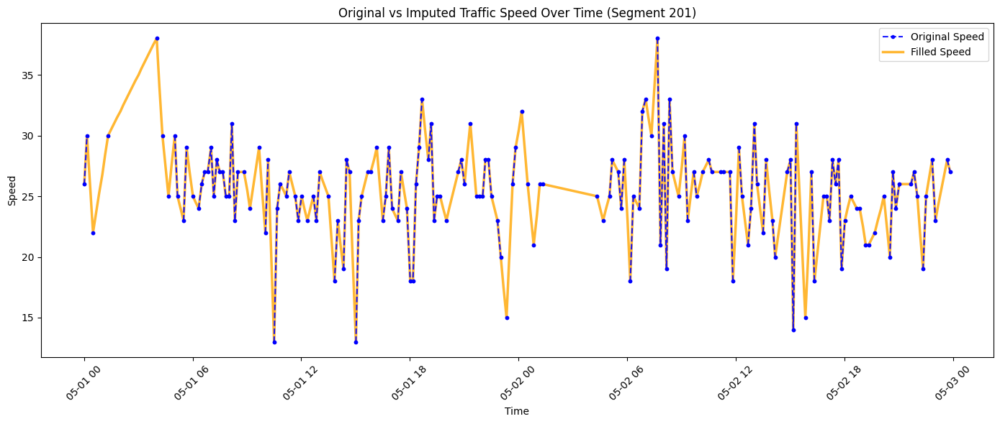

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# 1. Load data safely

#ensuring flexible parsers with no corruption
df = pd.read_csv(
    "chicago_traffic_imputed.csv",
    engine="python",
    on_bad_lines="skip"
)

#Prints how many rows were successfully loaded
print("Loaded rows:", len(df))


# 2. Clean required columns

#reading the time with dd/mm/yyyy
df["TIME"] = pd.to_datetime(df["TIME"], errors="coerce", dayfirst=True)

#Ensures both columns are numeric
df["SPEED"] = pd.to_numeric(df["SPEED"], errors="coerce")
df["SPEED_FILLED"] = pd.to_numeric(df["SPEED_FILLED"], errors="coerce")

#required for plotting
df = df.dropna(subset=["TIME", "SEGMENT_ID", "SPEED_FILLED"])


# 3. Pick segment

#Picks the segment with the most data
seg_id = df["SEGMENT_ID"].value_counts().idxmax()
seg = df[df["SEGMENT_ID"] == seg_id].copy().sort_values("TIME")


# 4. Filter specific time window
#Defines a time window (2 days)
start_time = pd.to_datetime("2025-05-01 00:00")
end_time   = pd.to_datetime("2025-05-02 23:59")

#Keeps only data within that window
seg = seg[(seg["TIME"] >= start_time) & (seg["TIME"] <= end_time)]

#shows selected segment details
print("Selected segment:", seg_id)
print("Rows in selected time range:", len(seg))


# 5. Plot

#using dashed line for the original speed.
#using filled solid line for the predicted missing speed values
plt.figure(figsize=(14,6))

plt.plot(
    seg["TIME"],
    seg["SPEED"],
    label="Original Speed",
    color="blue",
    linestyle="--",
    linewidth=1.5,
    marker="o",
    markersize=3,
    alpha=0.9,
    zorder=3
)

plt.plot(
    seg["TIME"],
    seg["SPEED_FILLED"],
    label="Filled Speed",
    color="orange",
    linewidth=2.5,
    alpha=0.8,
    zorder=2
)

plt.title(f"Original vs Imputed Traffic Speed Over Time (Segment {seg_id})")
plt.xlabel("Time")
plt.ylabel("Speed")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##Displays traffic behavior across all road segments simultaneously
This illustrates the general diversity and complexity of traffic patterns as well as how traffic speed changes throughout the day.

/tmp/ipykernel_5441/1433646440.py:7: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


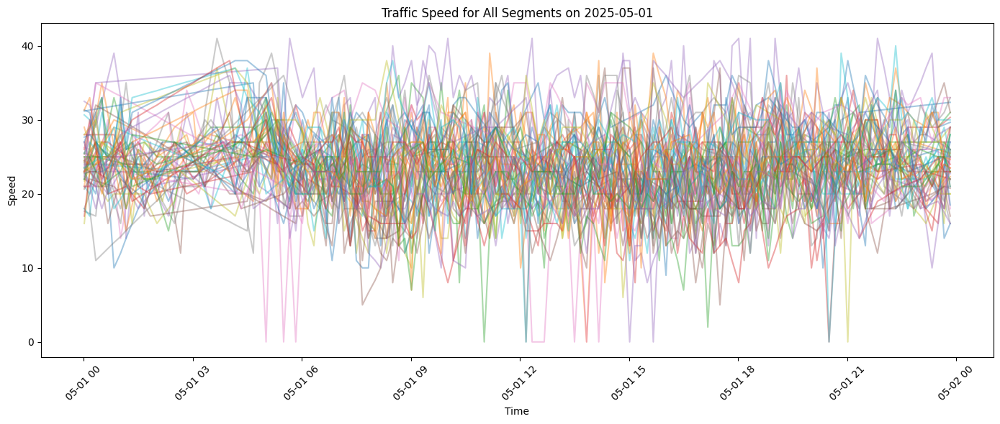

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# 1. Load cleaned data

df = pd.read_csv("chicago_traffic_imputed.csv")

#Convert TIME back to datetime for presentation
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")


# 2. Filter ONE date (May 1, 2025) for diaplay

target_date = "2025-05-01"
day_df = df[df["TIME"].dt.date == pd.to_datetime(target_date).date()].copy()


# 3. Plot ALL segments

plt.figure(figsize=(14,6))

#graph title, x and y axis
for seg_id, group in day_df.groupby("SEGMENT_ID"):
    group = group.sort_values("TIME")
    plt.plot(group["TIME"], group["SPEED_FILLED"], alpha=0.4)

plt.title(f"Traffic Speed for All Segments on {target_date}")
plt.xlabel("Time")
plt.ylabel("Speed")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

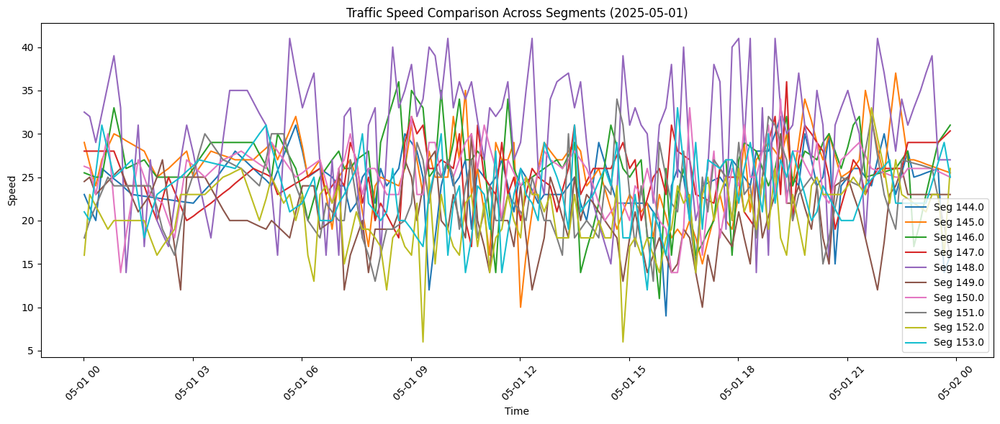

In [ ]:
#Pick the segments with most data
#the reason this is done is because the above graph is difficult to visualize
top_segments = (
    day_df["SEGMENT_ID"]
    .value_counts()
    .head(10)
    .index
)

#Plot the figure accordingly just like explained above
plt.figure(figsize=(14,6))

for seg_id in top_segments:
    group = day_df[day_df["SEGMENT_ID"] == seg_id].sort_values("TIME")
    plt.plot(group["TIME"], group["SPEED_FILLED"], label=f"Seg {seg_id}")

#graph title, x and y axis
plt.title(f"Traffic Speed Comparison Across Segments ({target_date})")
plt.xlabel("Time")
plt.ylabel("Speed")

plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##Average sepeed per segment on a specific day
This is done to compare segments to show which segments are fast and which are slow. It also reveals spatial differences and proves that traffic is not the same everywhere and that some roads consistently perform worse than others. It proves that the models need to be segment based and we cannot treat all segments the same way.

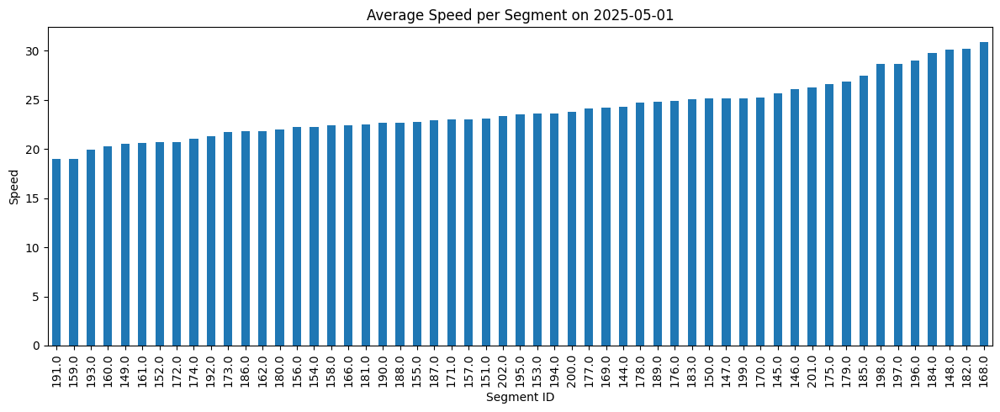

In [ ]:
#groups segments and finds their average speed
avg_speed = day_df.groupby("SEGMENT_ID")["SPEED_FILLED"].mean()

#plotting the average speed of all segments in a bar chart
plt.figure(figsize=(12,5))
avg_speed.sort_values().plot(kind="bar")

#graph title, x and y axis
plt.title(f"Average Speed per Segment on {target_date}")
plt.xlabel("Segment ID")
plt.ylabel("Speed")

plt.tight_layout()
plt.show()

##Average Speed by Hour (Daily Pattern)
The hourly average speed charts presented below consistently vary throughout the day and exhibit distinct temporal trends across segments showing that similar general trends, although variations in size draw attention to the regional diversity of traffic behaviour.

/tmp/ipykernel_5441/2925835432.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


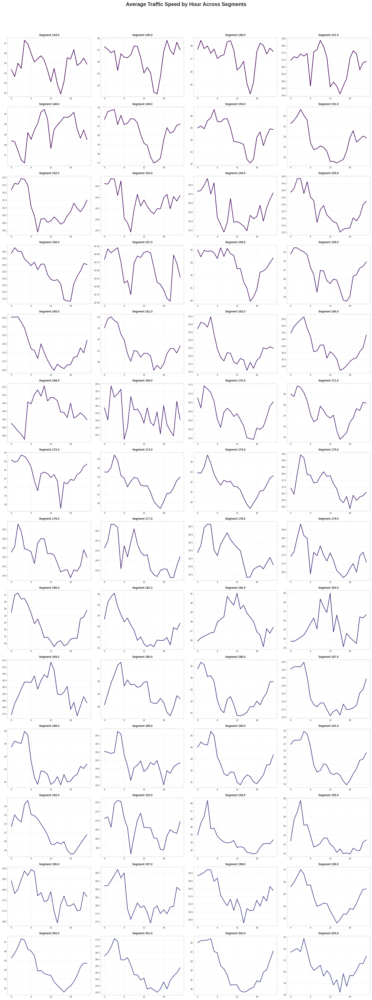

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import math

# Load dataset that is already cleaned
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME to DD/mm/yyyy if not already done
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")
df["HOUR"] = df["TIME"].dt.hour

#Identifies all unique road segment
segments = df["SEGMENT_ID"].unique()

#define the grid size
n = len(segments)
cols = 4
rows = math.ceil(n / cols)

#Use a clean style to represent the graphs
plt.style.use("seaborn-v0_8-whitegrid")

#Create figure to put all the graphs inside
fig, axes = plt.subplots(rows, cols, figsize=(18, rows*3.5))
axes = axes.flatten()

#Color palette for a good looking gradient
colors = plt.cm.viridis(range(len(segments)))

#loops through each segment to create a plot for
for i, seg_id in enumerate(segments):
    seg = df[df["SEGMENT_ID"] == seg_id]
    hourly_avg = seg.groupby("HOUR")["SPEED_FILLED"].mean()

    axes[i].plot(
        hourly_avg.index,
        hourly_avg.values,
        color=colors[i],
        linewidth=2
    )

    axes[i].set_title(f"Segment {seg_id}", fontsize=10, fontweight='bold')
    axes[i].set_xticks(range(0,24,6))
    axes[i].tick_params(axis='both', labelsize=8)

    #creating a light grid with --
    axes[i].grid(True, linestyle='--', alpha=0.4)

#Remove empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

#Main title to be placed ontop all the plots
plt.suptitle(
    "Average Traffic Speed by Hour Across Segments",
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

##Distribution of Speeds (Histogram)
to understand the distribution and show how speeds are spread


/tmp/ipykernel_5441/3654458684.py:5: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


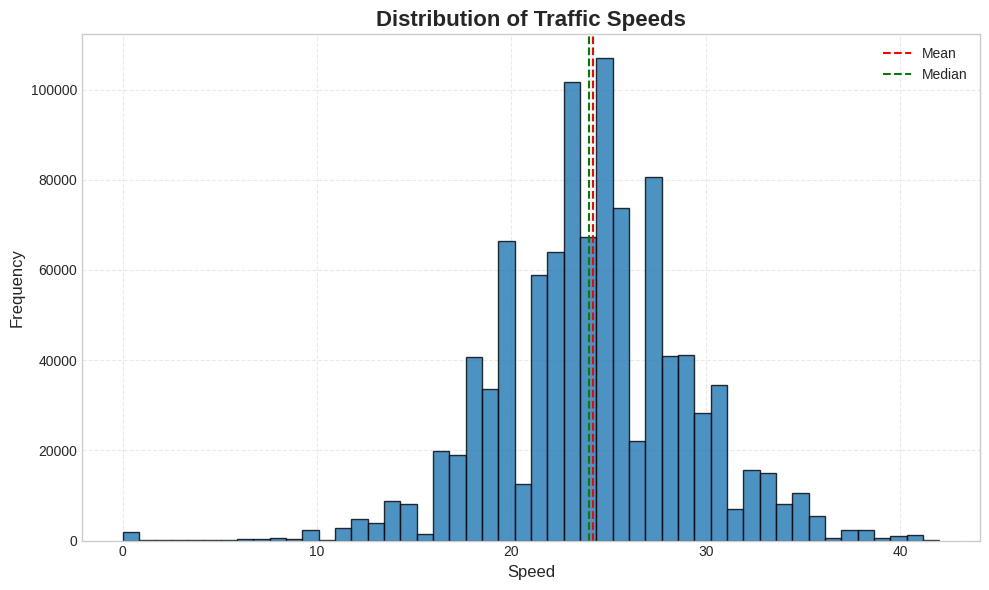

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("chicago_traffic_imputed.csv")

# to represent histograph in a clean style
plt.style.use("seaborn-v0_8-whitegrid")

plt.figure(figsize=(10,6))

#plotting histogram from the filled speed
plt.hist(
    df["SPEED_FILLED"],
    bins=50,
    edgecolor='black',
    alpha=0.8
)

#identifying the title of the plot
plt.title(
    "Distribution of Traffic Speeds",
    fontsize=16,
    fontweight='bold'
)

#identifying x and y axis
plt.xlabel("Speed", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

#calculating the mean and the median
mean_speed = df["SPEED_FILLED"].mean()
median_speed = df["SPEED_FILLED"].median()

#plotting the mean and the median for the speeds
plt.axvline(mean_speed, color='red', linestyle='--', label='Mean')
plt.axvline(median_speed, color='green', linestyle='--', label='Median')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

##The Boxplot by Hour
- To see how traffic changes throughout the day
- To identify busy hours vs free-flow hours
- To understand how consistent or variable speeds are at each hour
- To spot outliers like sudden congestion

/tmp/ipykernel_5441/663993948.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")
/tmp/ipykernel_5441/663993948.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


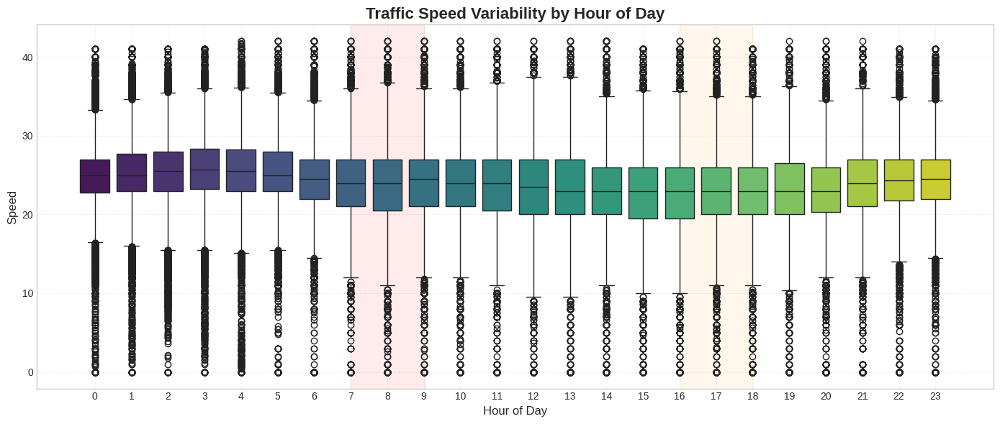

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME to dd/mm/yyyy if not already converted
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")
df["HOUR"] = df["TIME"].dt.hour

#makes a clean plot for the graph
plt.style.use("seaborn-v0_8-whitegrid")

plt.figure(figsize=(14,6))

#identofying the box plot and what variables we are using
sns.boxplot(
    x="HOUR",
    y="SPEED_FILLED",
    data=df,
    palette="viridis"
)

#Highlights the peak hours
plt.axvspan(7, 9, color='red', alpha=0.08)      #Morning rush
plt.axvspan(16, 18, color='orange', alpha=0.08) #Evening rush

#Titles and labels for the graph
plt.title(
    "Traffic Speed Variability by Hour of Day",
    fontsize=16,
    fontweight='bold'
)

#identifying x and y axis labels
plt.xlabel("Hour of Day", fontsize=12)
plt.ylabel("Speed", fontsize=12)

#the grid of the plot as --
plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

##Hourly Speed Statistics for Chicago Traffic Data
This code's objective is to examine Chicago traffic speed trends at various times of the day. It determines peak traffic hours, computes descriptive data for vehicle speeds, and indicates which hours have the greatest and least changeable traffic speeds.

In [ ]:
import pandas as pd

# Load the dataset containing Chicago traffic data with imputed speed values
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME column from string to datetime object for easier manipulation
# Format: day/month/year hour:minute, errors="coerce" turns invalid dates into NaT
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")
# Extract the hour component (0-23) from the TIME column
df["HOUR"] = df["TIME"].dt.hour

# Compute descriptive statistics for SPEED_FILLED grouped by hour of day
stats = df.groupby("HOUR")["SPEED_FILLED"].agg(
    count="count",   # Number of observations per hour
    mean="mean",     # Average speed per hour
    median="median", # Median speed per hour
    std="std",       # Standard deviation (variability measure)
    min="min",       # Minimum speed observed
    max="max"        # Maximum speed observed
)

# Add first quartile (25th percentile) for boxplot interpretation
stats["Q1"] = df.groupby("HOUR")["SPEED_FILLED"].quantile(0.25)
# Add third quartile (75th percentile) for boxplot interpretation
stats["Q3"] = df.groupby("HOUR")["SPEED_FILLED"].quantile(0.75)

# Round all values to 2 decimal places for cleaner output
# Sort by hour index (0 to 23) for chronological order
stats = stats.round(2).sort_index()

# Print the complete statistics table for all 24 hours
print("\n=== Speed Statistics by Hour ===\n")
print(stats)

# Define typical rush hour periods: morning (7-9) and evening (16-18)
peak_hours = [7, 8, 9, 16, 17, 18]
# Print subset of statistics only for peak traffic hours
print("\n=== Peak Hour Statistics ===\n")
print(stats.loc[peak_hours])

# Find which hour has the highest speed variability (largest standard deviation)
most_variable = stats["std"].idxmax()
# Find which hour has the lowest speed variability (smallest standard deviation)
least_variable = stats["std"].idxmin()

# Print automatic insights from the data analysis
print("\n=== Key Insights ===")
print(f"Most variable hour: {most_variable} (std = {stats.loc[most_variable, 'std']})")
print(f"Least variable hour: {least_variable} (std = {stats.loc[least_variable, 'std']})")

/tmp/ipykernel_5441/3060687960.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")



=== Speed Statistics by Hour ===

      count   mean  median   std  min   max     Q1     Q3
HOUR                                                     
0     42634  24.95   25.00  4.33  0.0  41.0  22.80  27.00
1     42798  25.29   25.00  4.17  0.0  41.0  23.00  27.67
2     42474  25.57   25.55  4.11  0.0  41.0  23.00  28.00
3     42798  25.80   25.71  4.34  0.0  41.0  23.20  28.33
4     42688  25.63   25.50  4.53  0.0  42.0  23.00  28.25
5     42743  25.37   25.00  4.56  0.0  42.0  23.00  28.00
6     42634  24.58   24.50  4.66  0.0  42.0  22.00  27.00
7     42682  24.24   24.00  4.98  0.0  42.0  21.00  27.00
8     42627  23.95   24.00  5.24  0.0  42.0  20.50  27.00
9     42407  24.44   24.50  5.20  0.0  42.0  21.00  27.00
10    42077  24.38   24.00  5.09  0.0  42.0  21.00  27.00
11    42407  23.97   24.00  5.07  0.0  42.0  20.50  27.00
12    42576  23.69   23.50  5.24  0.0  42.0  20.00  27.00
13    42036  23.49   23.00  5.14  0.0  42.0  20.00  27.00
14    42526  23.25   23.00  5.18  0.0

##Per-Segment Hourly Traffic Speed Analysis for Chicago Roads
- Segment-level analysis: For every distinct road segment identification, compute hourly speed statistics (mean, median, standard deviation, minimum, maximum, and quartiles).

- Determine the hours with the slowest or most variable speeds for each particular road by identifying the peak congestion periods for each segment.

- Compare traffic patterns between segments to see how several road segments behave at the same time.

- Determine when hours each stretch suffers erratic traffic speeds (high standard deviation) to identify high-variability sites.

In [ ]:
import pandas as pd

# Load the Chicago traffic dataset with imputed speed values
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME column from string to datetime object
# Format: day/month/year hour:minute, errors="coerce" handles invalid dates
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")
# Extract the hour component (0-23) from the TIME column
df["HOUR"] = df["TIME"].dt.hour

# Group data by both SEGMENT_ID and HOUR to analyze each road segment separately per hour
stats = df.groupby(["SEGMENT_ID", "HOUR"])["SPEED_FILLED"].agg(
    count="count",   # Number of observations for this segment at this hour
    mean="mean",     # Average speed for this segment at this hour
    median="median", # Median speed (less sensitive to outliers)
    std="std",       # Standard deviation (variability of traffic flow)
    min="min",       # Minimum recorded speed
    max="max"        # Maximum recorded speed
)

# Calculate first quartile (25th percentile) for each segment and hour
q1 = df.groupby(["SEGMENT_ID", "HOUR"])["SPEED_FILLED"].quantile(0.25)
# Calculate third quartile (75th percentile) for each segment and hour
q3 = df.groupby(["SEGMENT_ID", "HOUR"])["SPEED_FILLED"].quantile(0.75)

# Add quartiles to the statistics DataFrame
stats["Q1"] = q1
stats["Q3"] = q3

# Round all numeric values to 2 decimal places for cleaner output
stats = stats.round(2)

# Get sorted list of unique segment IDs (removing any NaN values)
segments = sorted(df["SEGMENT_ID"].dropna().unique())

# Loop through each segment and print its hourly statistics
for seg_id in segments:
    # Extract statistics for current segment and sort by hour
    seg_stats = stats.loc[seg_id].sort_index()

    print("\n" + "="*60)
    print(f"SEGMENT {seg_id} - Speed Statistics by Hour")
    print("="*60)
    print(seg_stats)

    # Identify most and least variable hours based on standard deviation
    valid_std = seg_stats["std"].dropna()  # Remove any missing std values
    if len(valid_std) > 0:
        # Hour with highest speed variability (largest standard deviation)
        most_variable = valid_std.idxmax()
        # Hour with lowest speed variability (smallest standard deviation)
        least_variable = valid_std.idxmin()

        print("\nKey Insights:")
        print(f"Most variable hour: {most_variable} (std = {seg_stats.loc[most_variable, 'std']})")
        print(f"Least variable hour: {least_variable} (std = {seg_stats.loc[least_variable, 'std']})")
    else:
        print("\nKey Insights:")
        print("Not enough data to compute variability for this segment.")

/tmp/ipykernel_5441/1518055730.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")



SEGMENT 144.0 - Speed Statistics by Hour
      count   mean  median   std   min   max     Q1     Q3
HOUR                                                      
0        96  24.36   24.00  3.24  16.0  34.0  22.62  26.05
1        96  23.66   23.50  2.65  15.0  31.0  22.62  25.00
2        96  25.00   24.31  2.95  20.0  34.0  23.00  26.51
3        96  24.48   24.00  2.94  18.0  32.0  22.75  26.00
4        96  27.31   27.00  3.47  18.0  34.0  24.67  29.67
5        96  26.95   27.00  2.86  22.0  34.0  24.94  29.00
6        96  25.99   25.50  3.34  17.0  34.0  24.00  28.50
7        96  25.13   25.00  3.86  16.0  34.0  23.00  27.12
8        94  25.45   25.00  3.39  16.0  34.0  24.00  27.00
9        90  25.75   26.00  3.61  12.0  34.0  24.00  28.00
10       90  25.32   26.00  4.18  11.0  34.0  23.62  27.00
11       90  24.31   25.00  3.86  14.0  32.0  22.00  27.00
12       94  23.15   24.00  3.74  10.0  33.0  21.00  25.50
13       96  24.48   25.00  3.33  17.0  34.0  22.62  26.50
14       96  2

##Hourly Traffic Speed Distribution Visualization by Road Segmen
Visualize speed distributions - Use boxplots to show the range, median, quartiles, and outliers of speeds for each hour and compare hourly patterns

/tmp/ipykernel_5441/2917443470.py:6: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")
/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


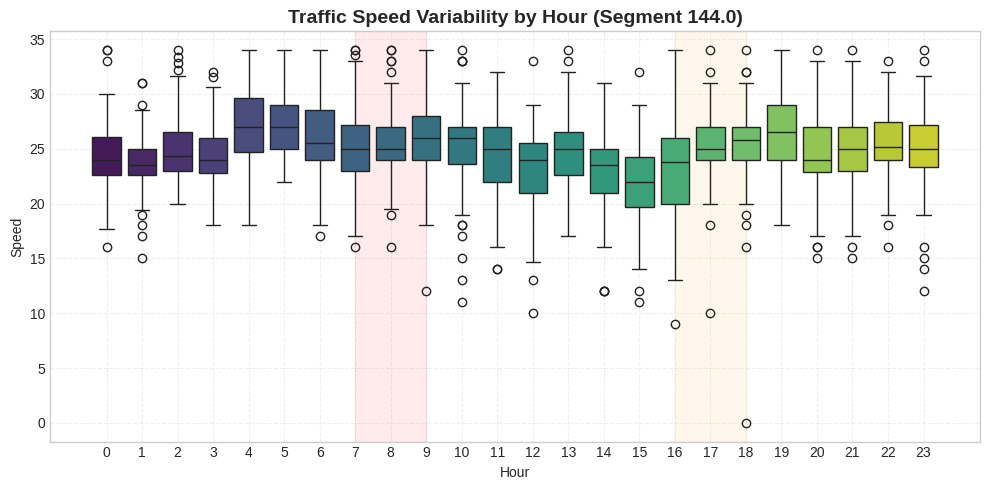

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


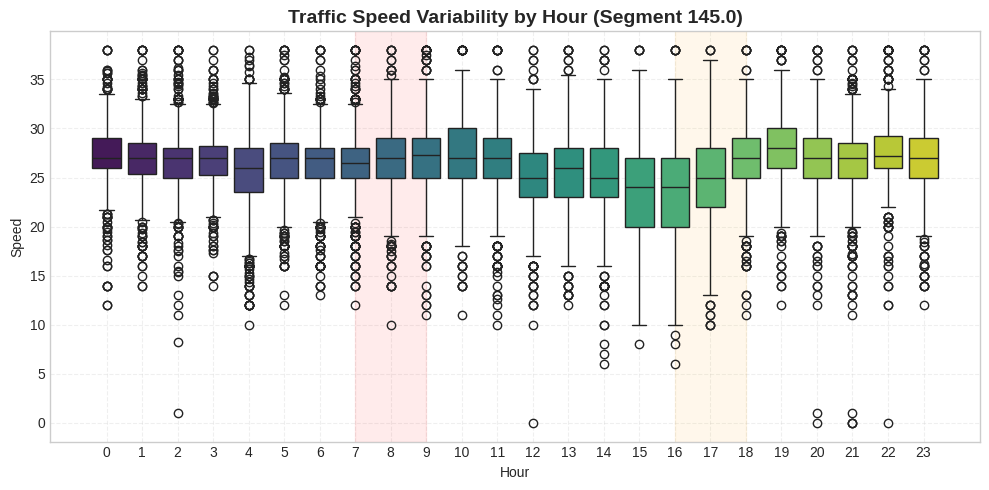

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


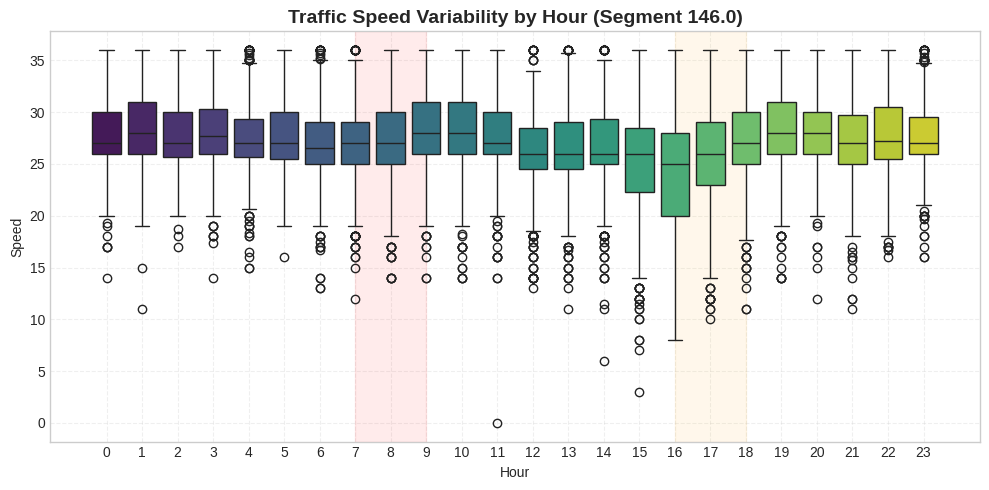

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


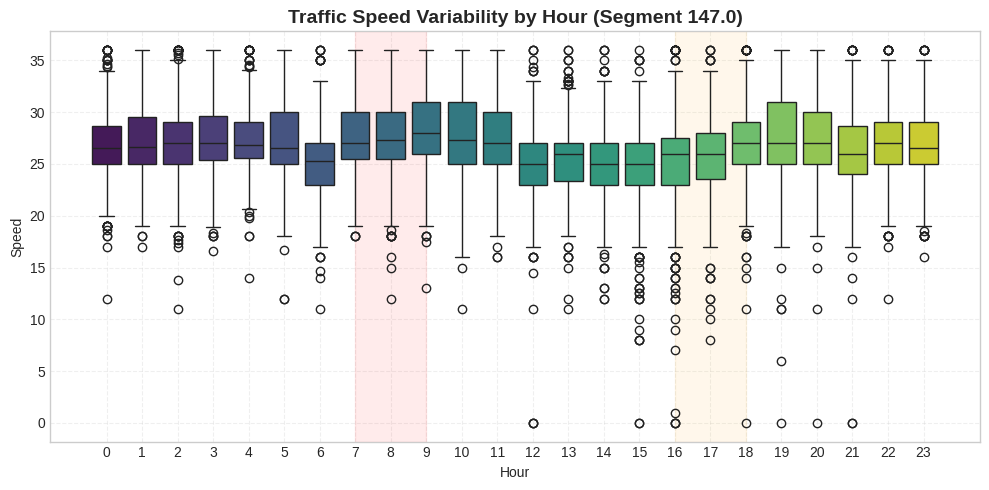

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


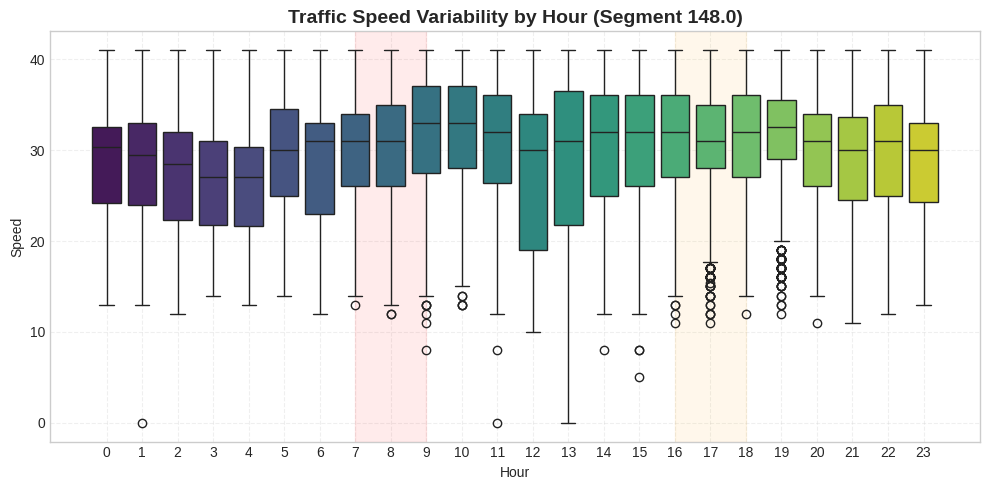

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


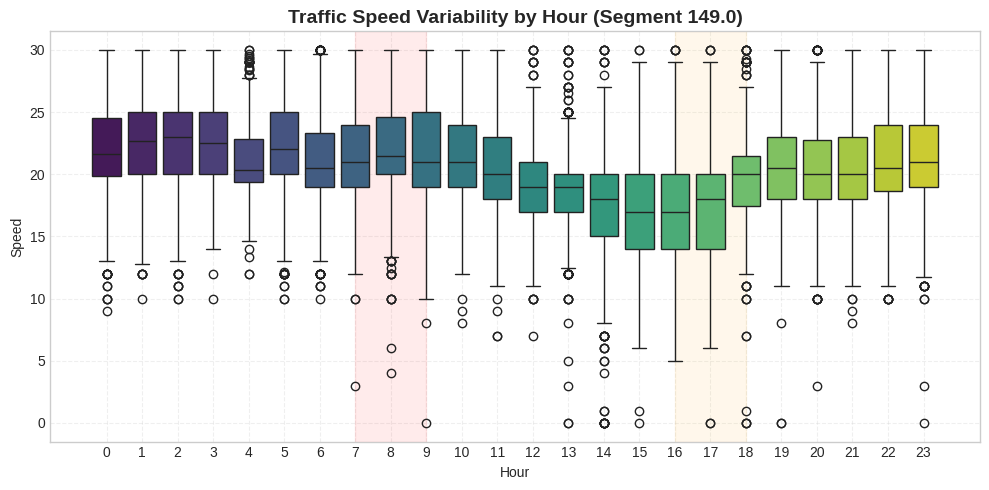

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


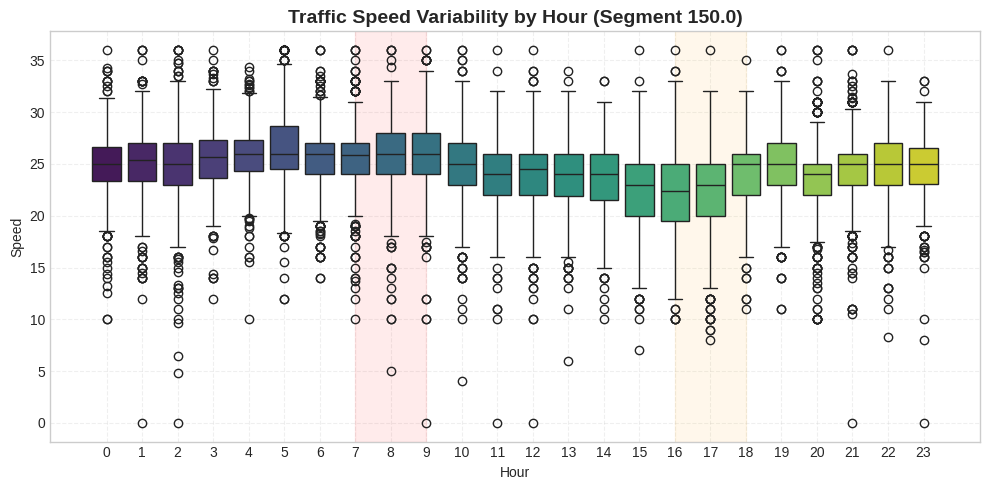

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


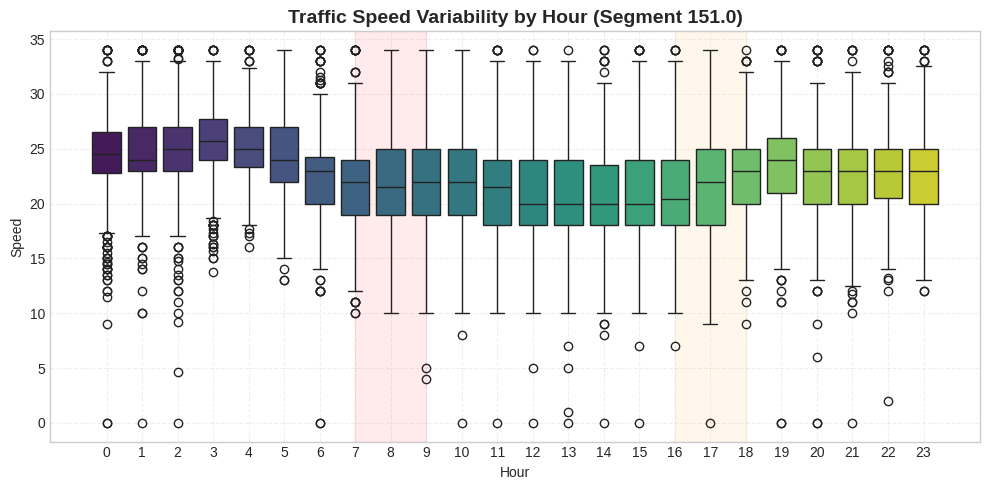

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


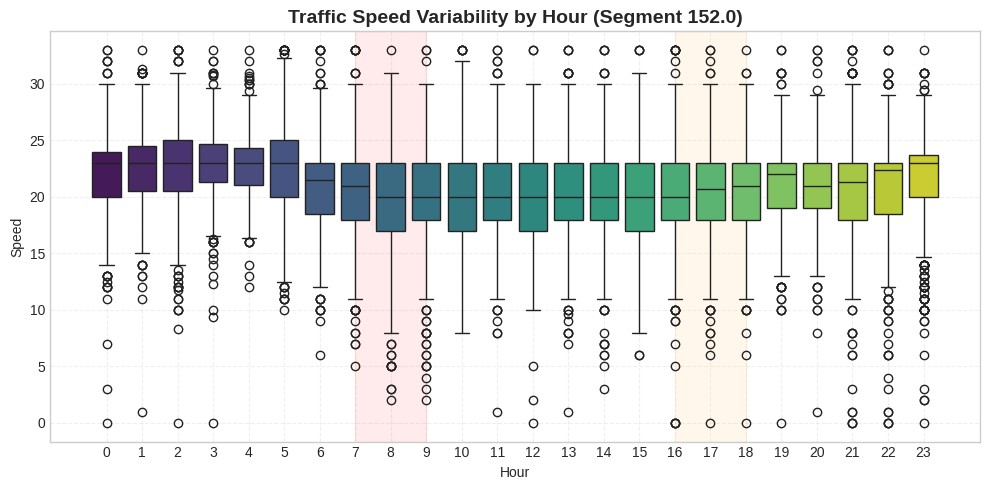

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


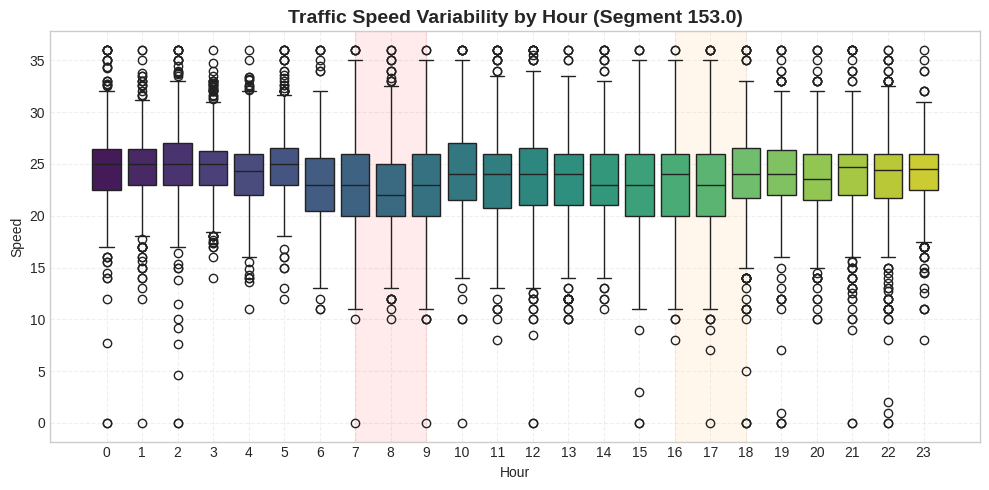

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


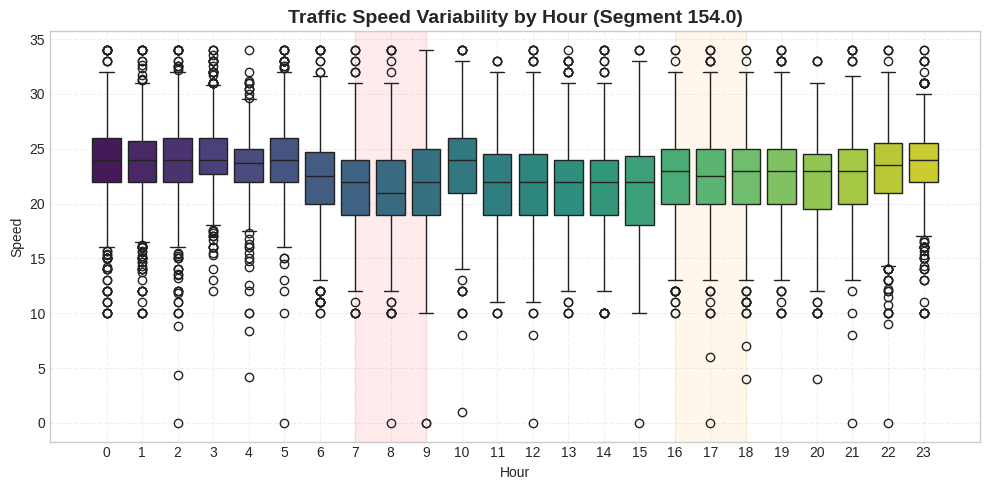

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


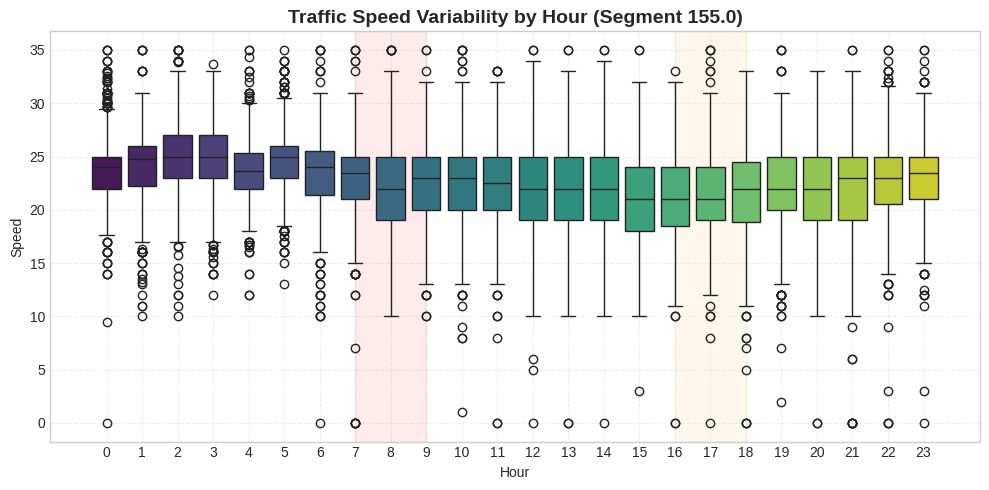

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


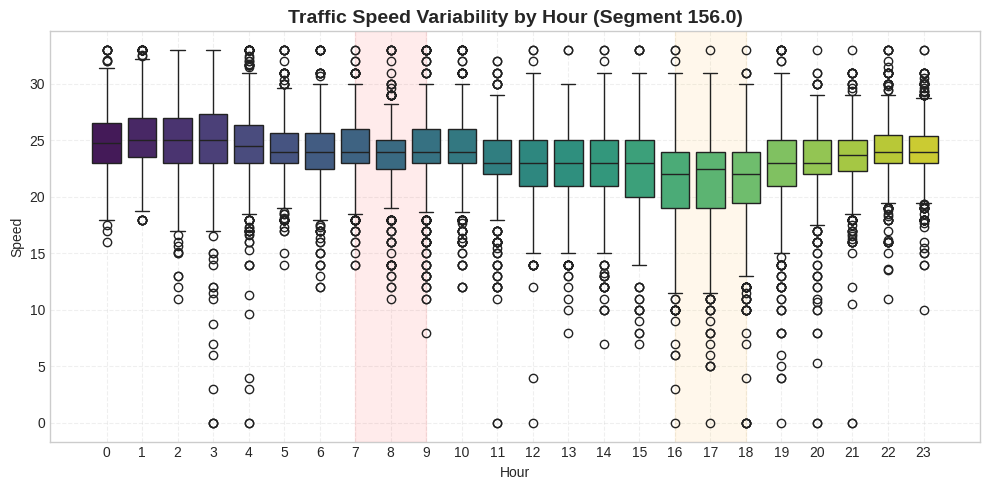

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


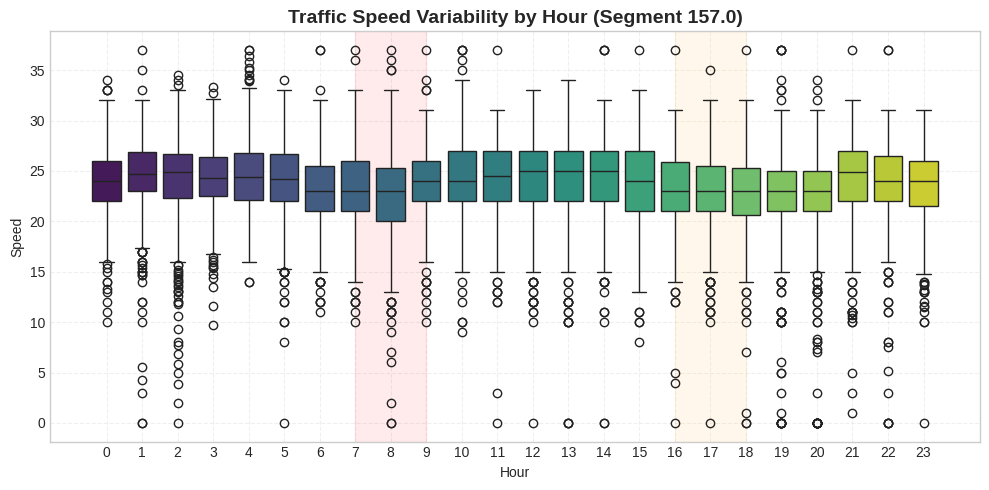

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


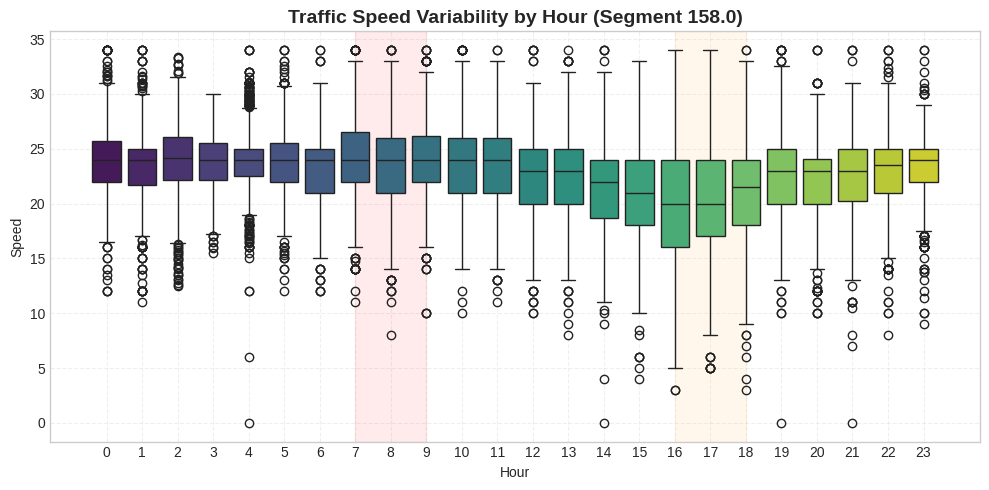

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


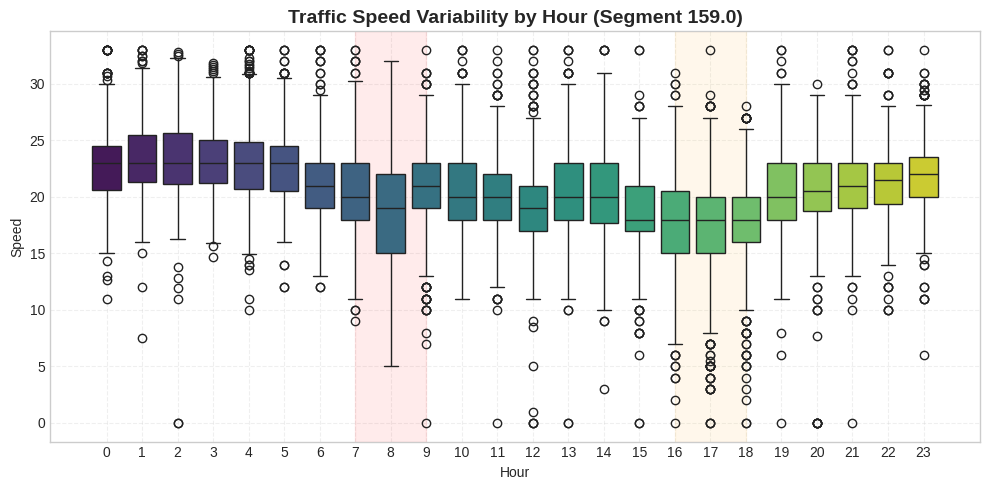

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


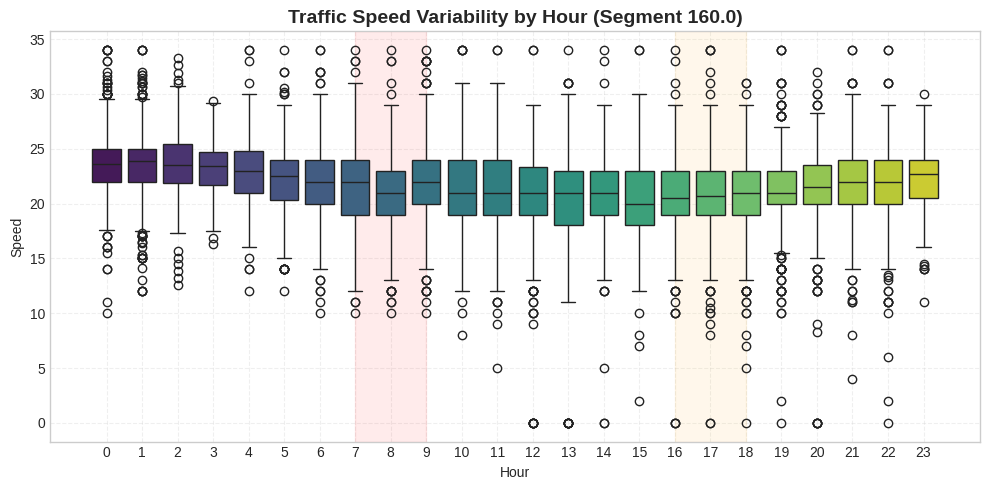

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


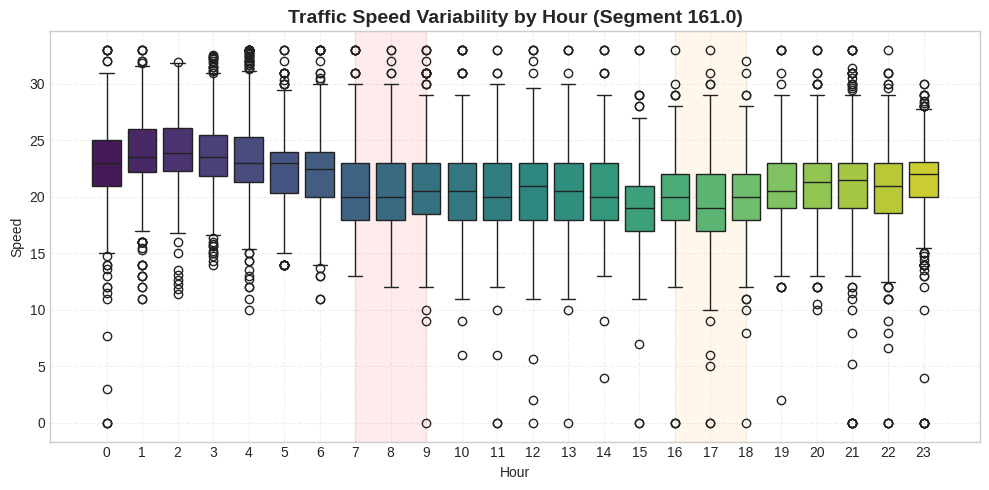

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


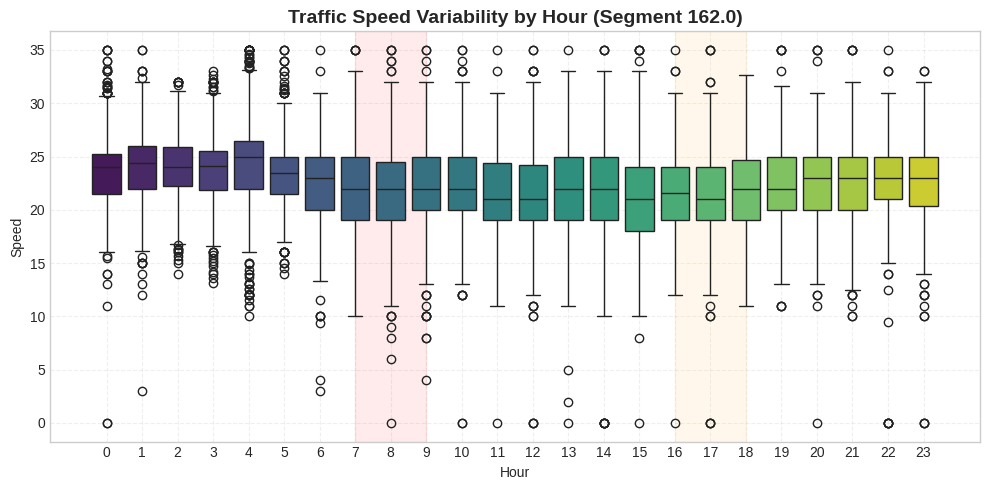

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


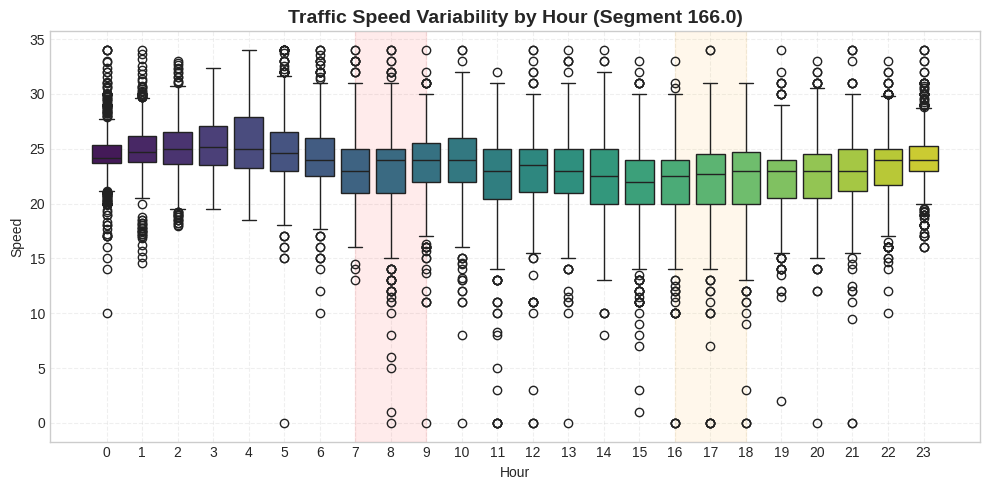

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


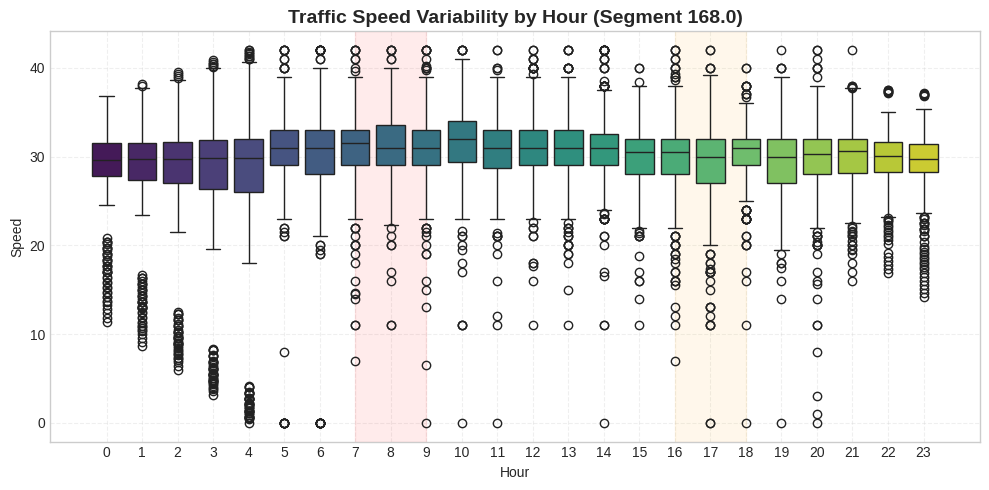

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


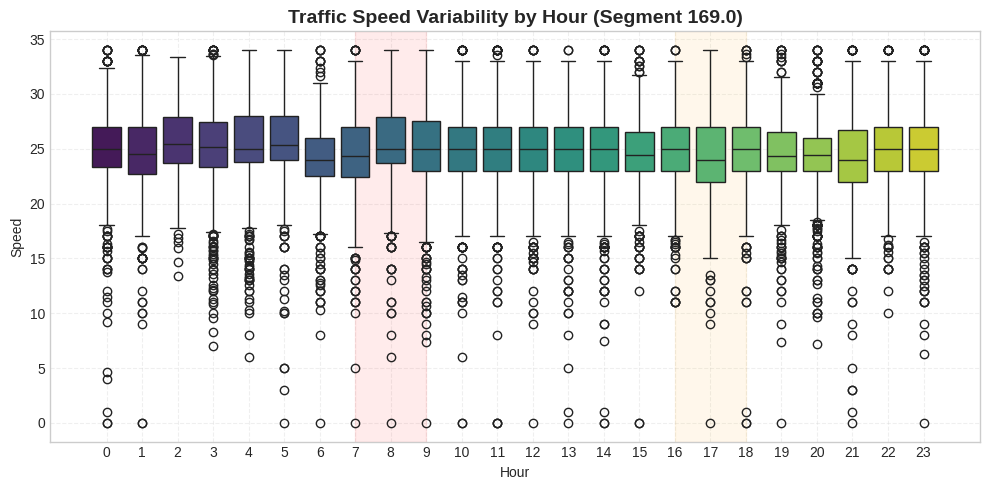

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


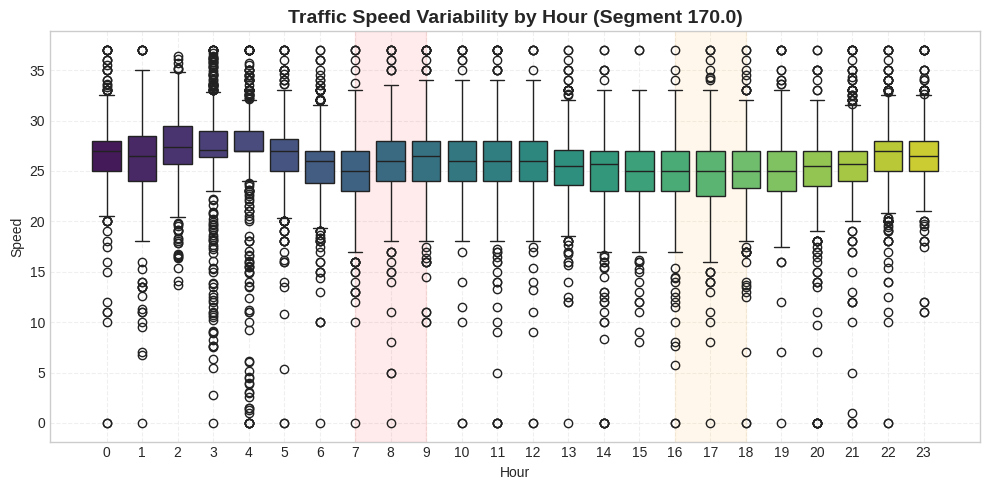

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


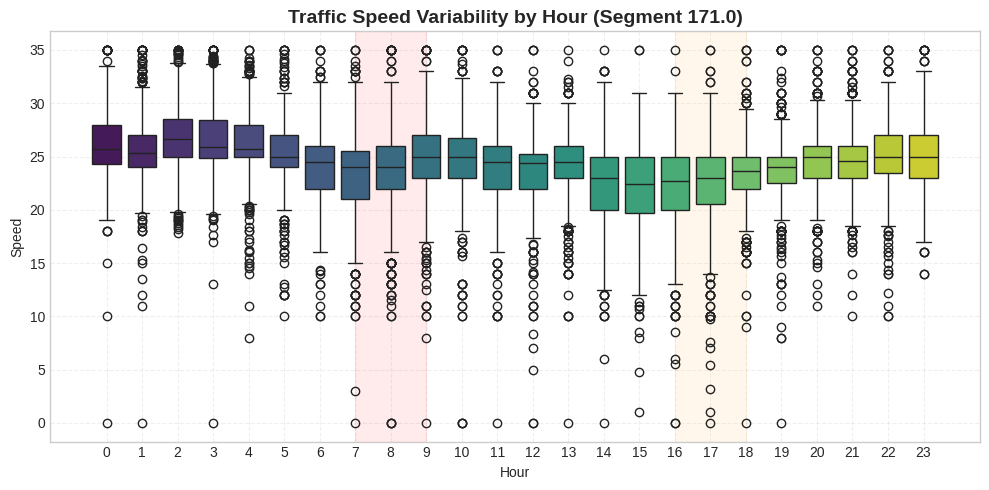

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


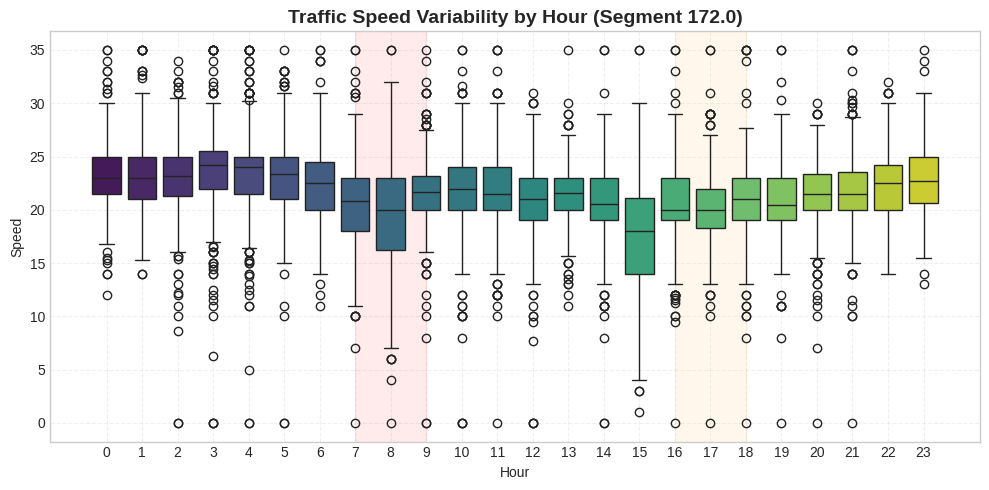

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


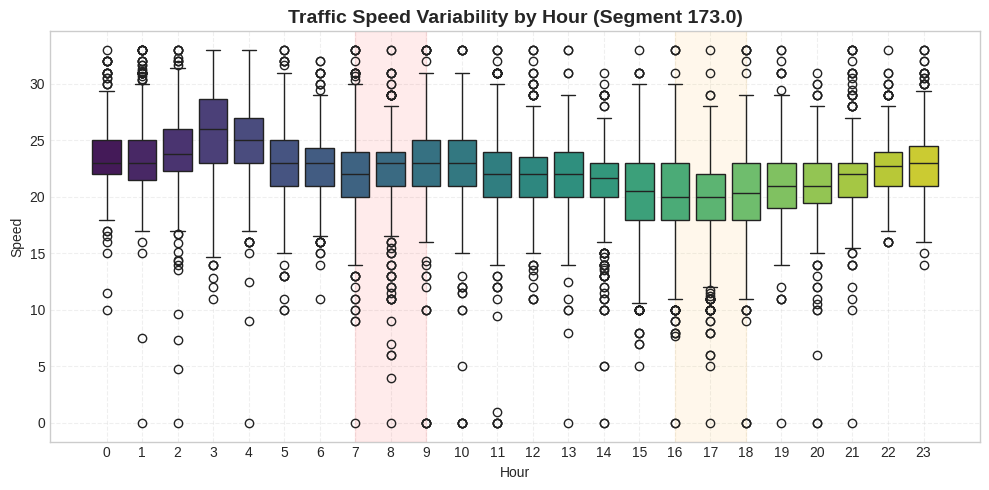

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


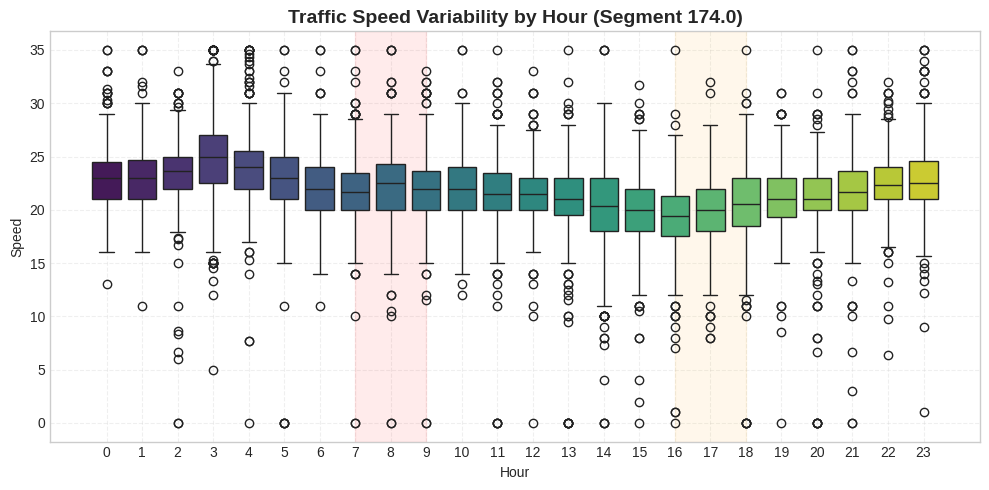

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


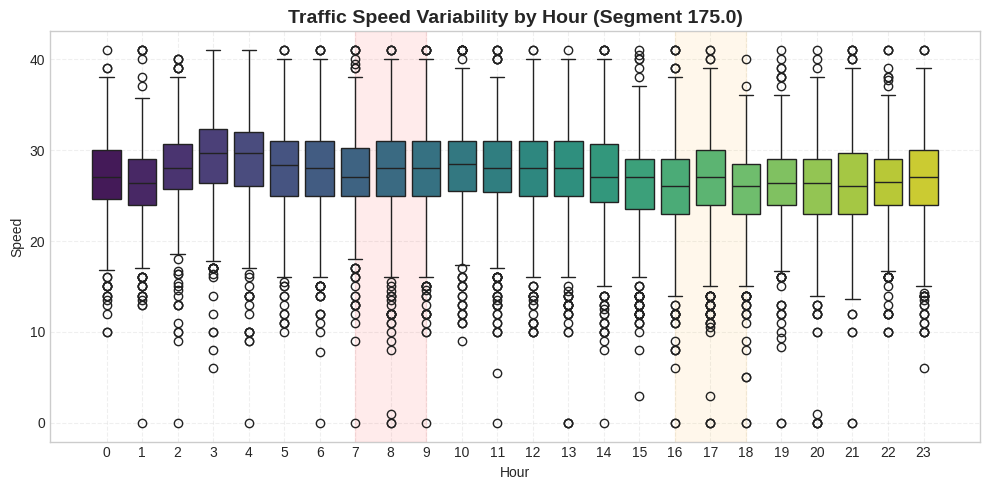

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


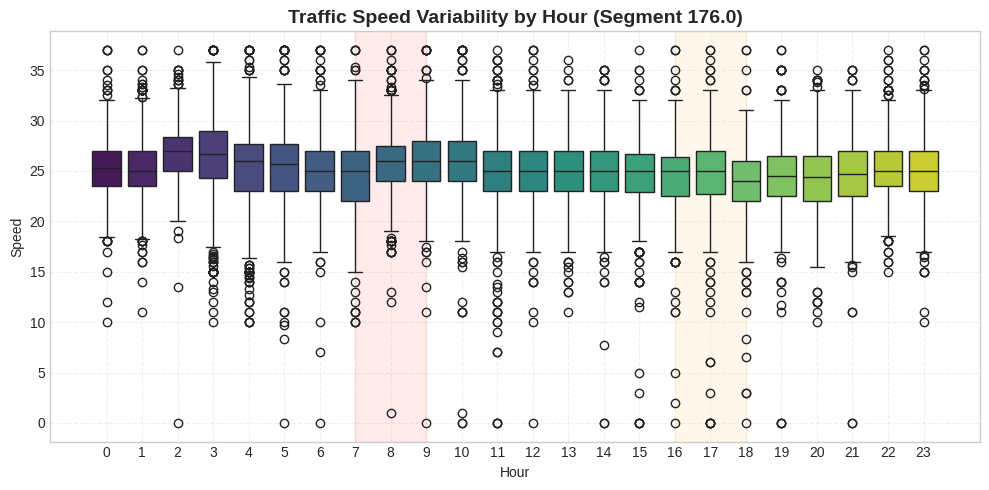

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


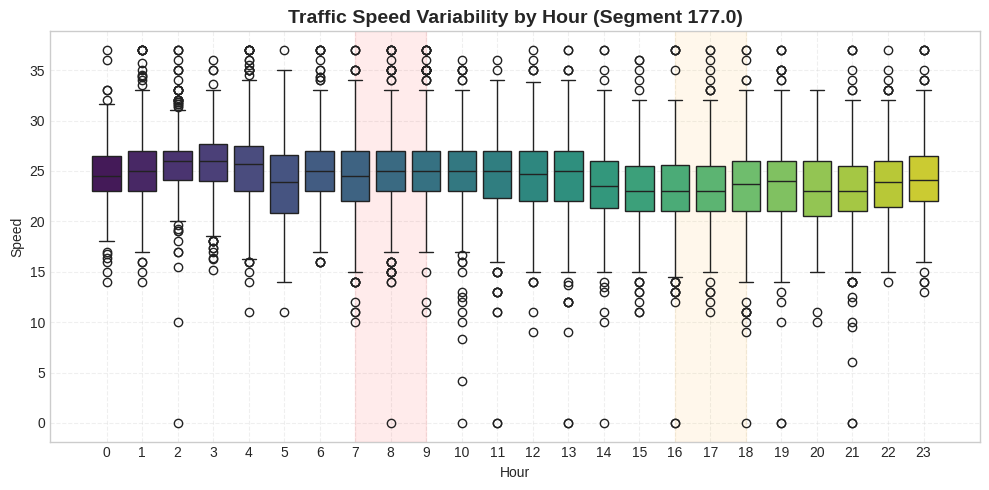

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


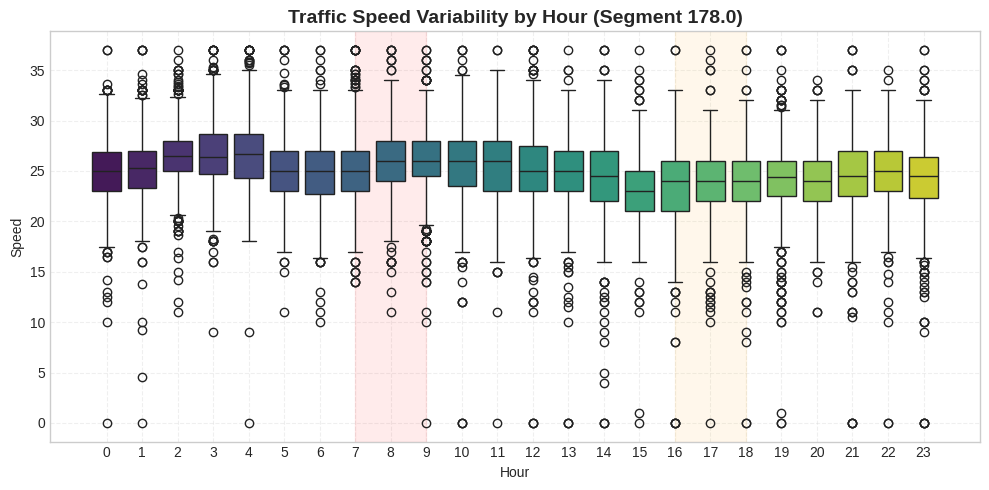

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


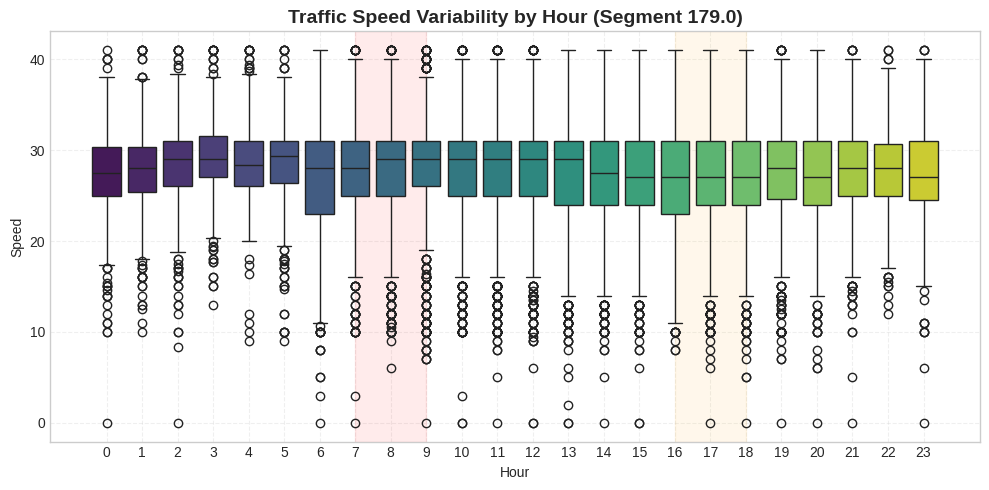

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


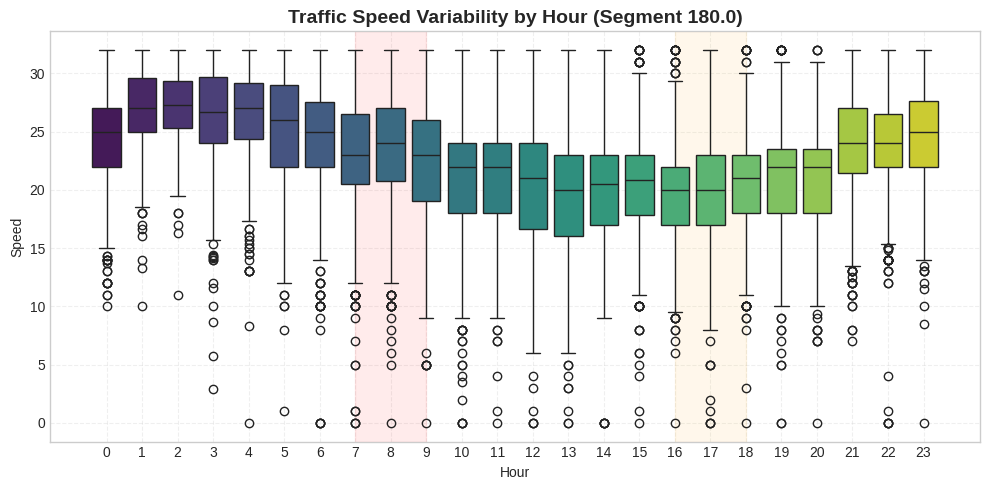

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


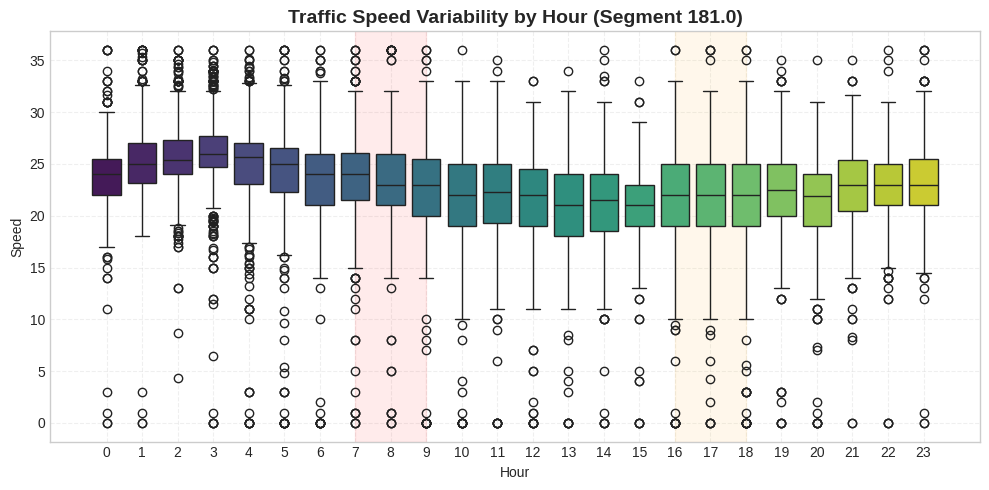

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


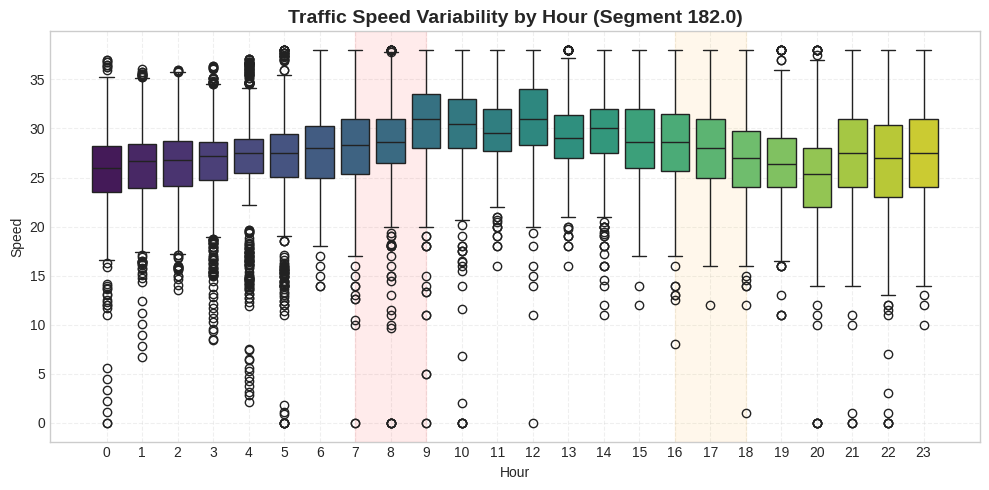

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


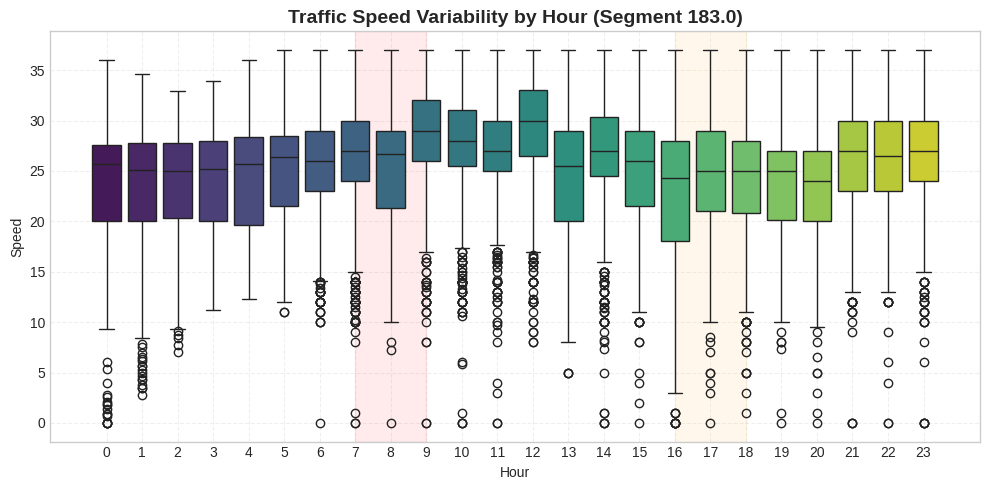

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


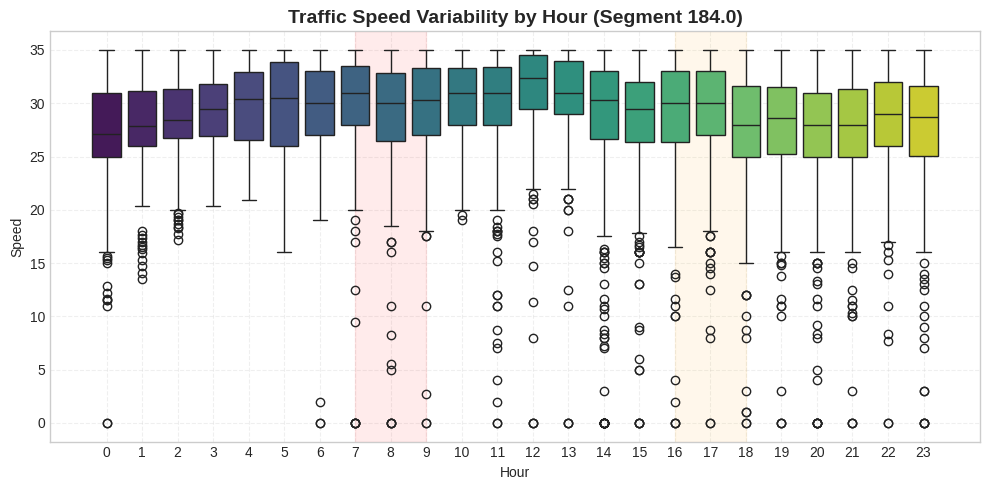

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


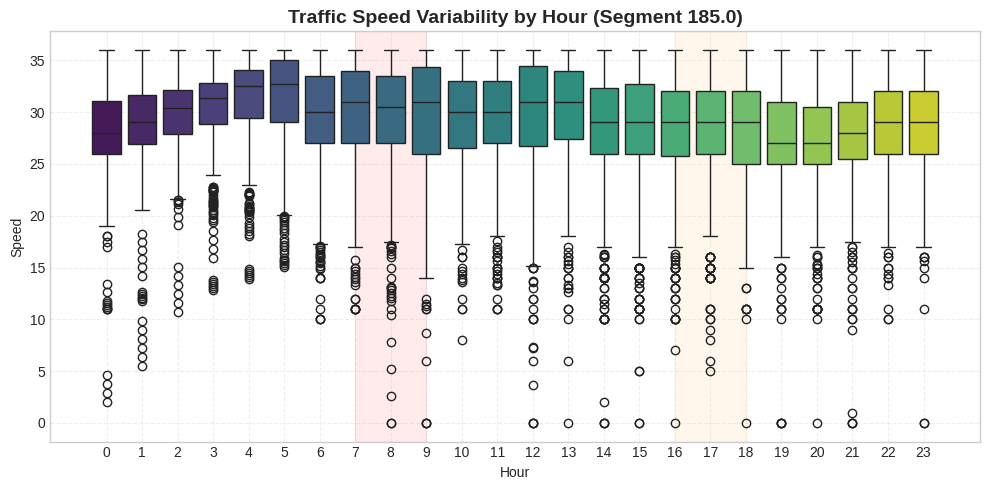

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


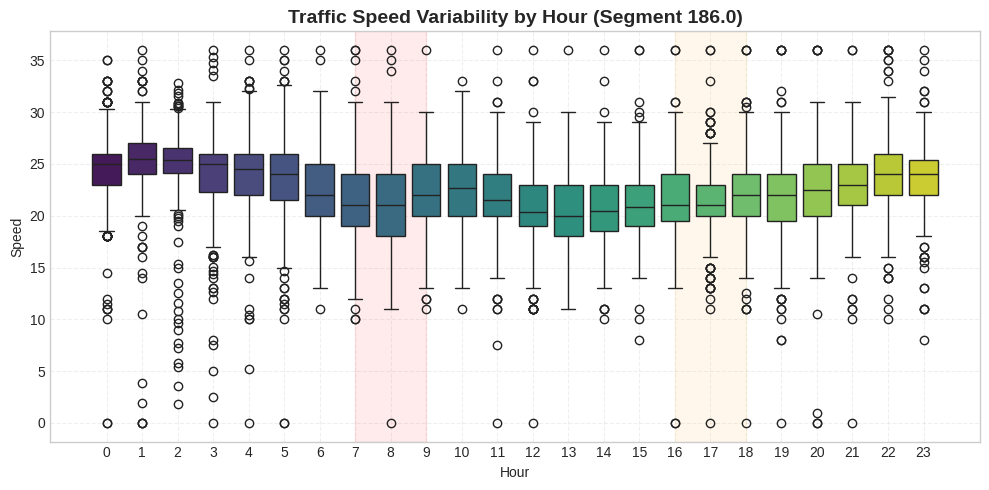

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


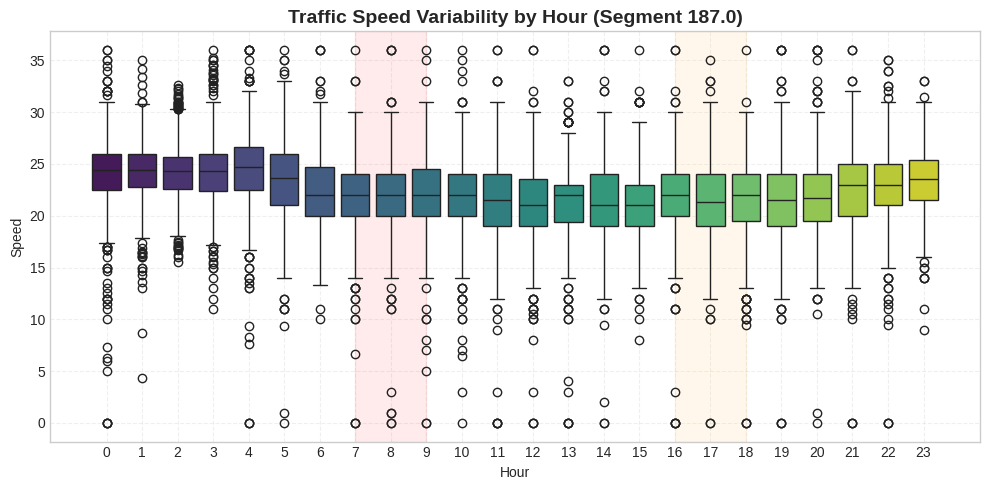

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


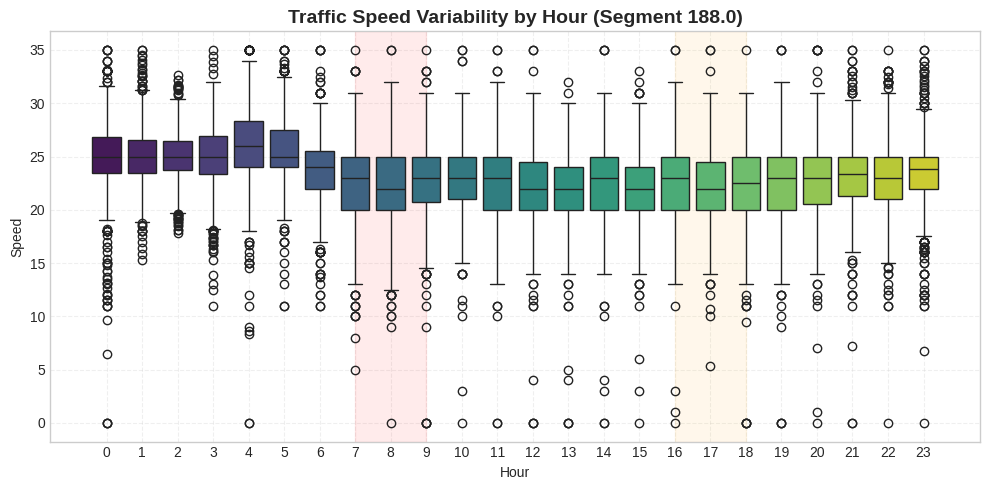

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


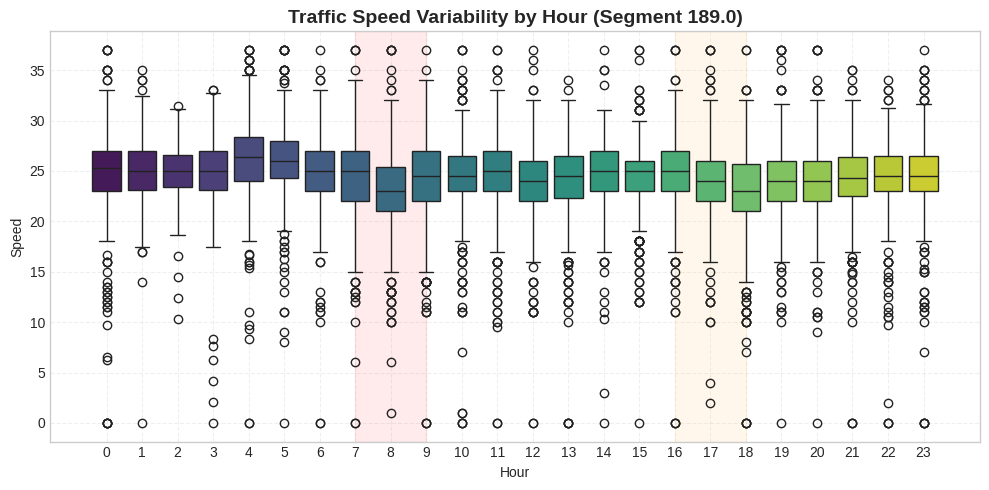

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


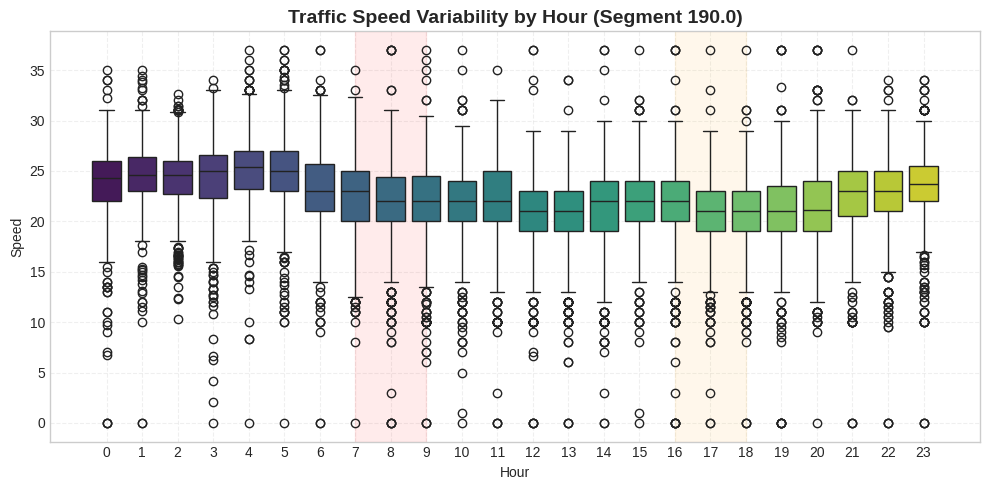

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


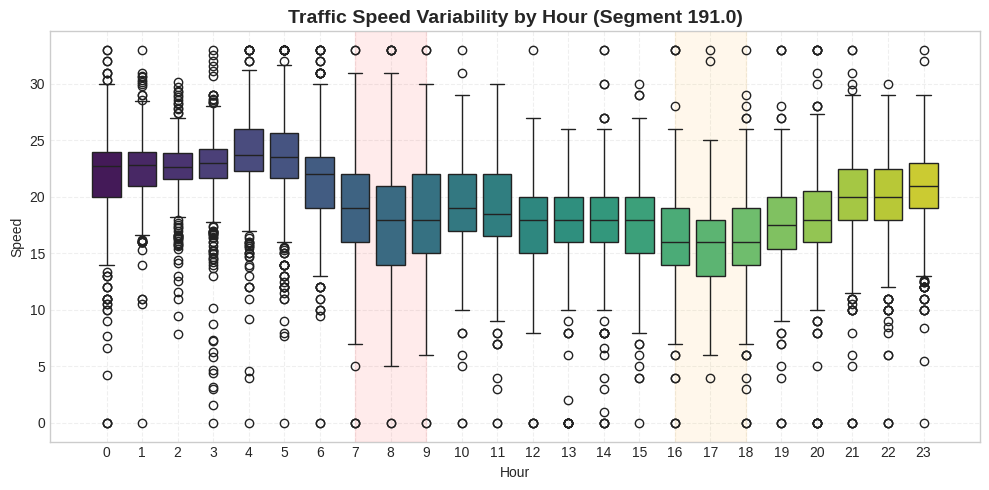

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


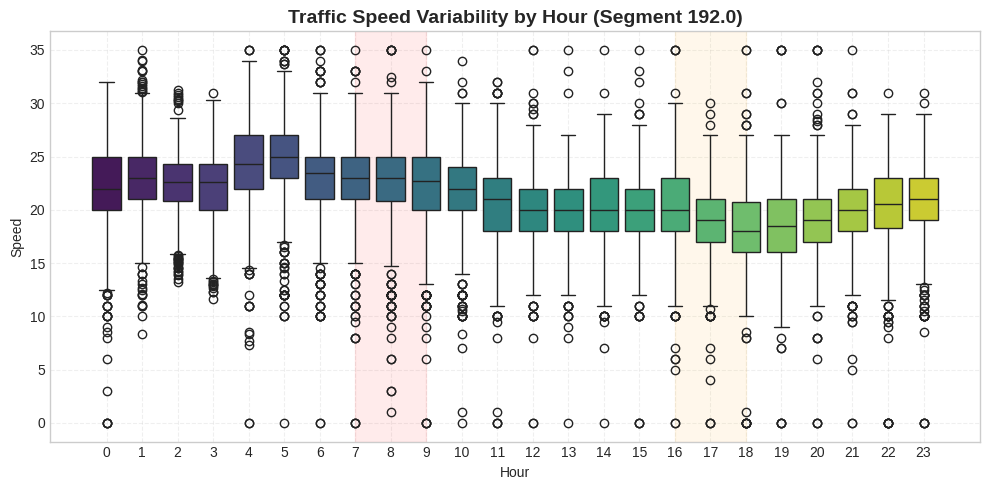

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


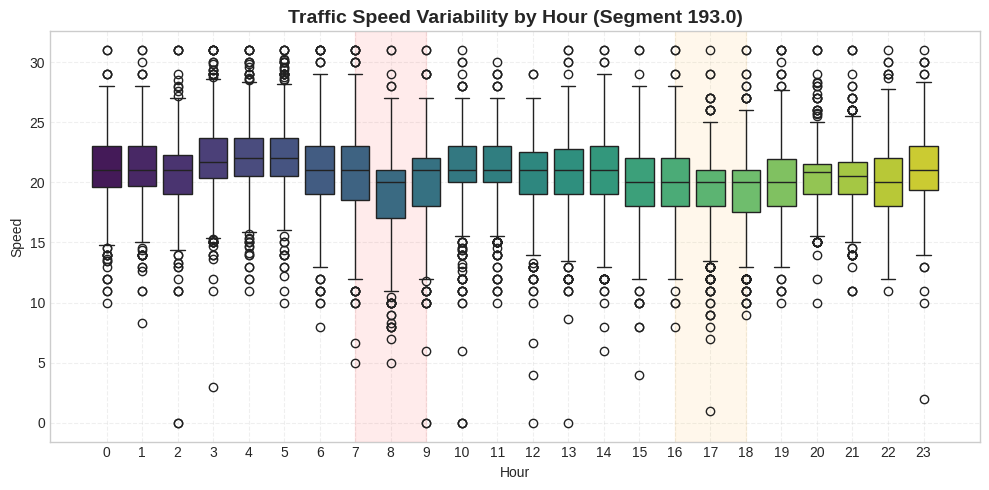

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


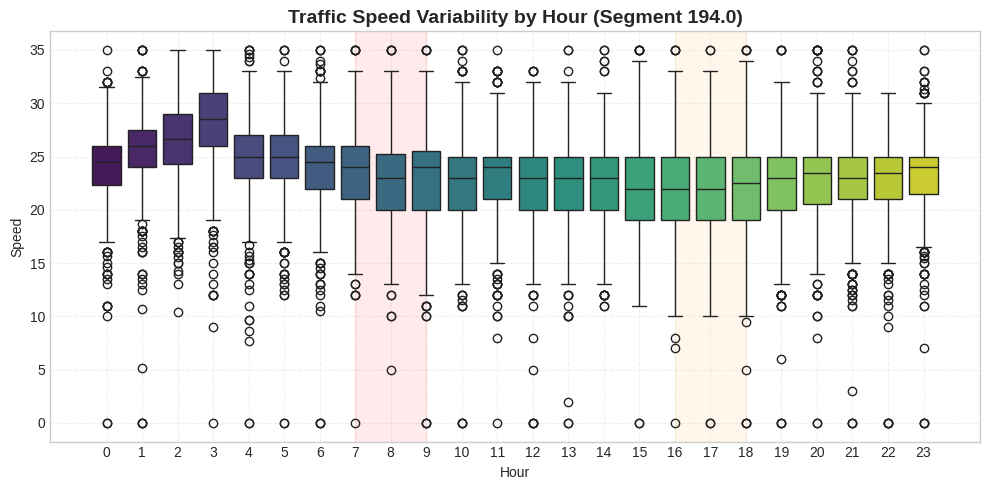

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


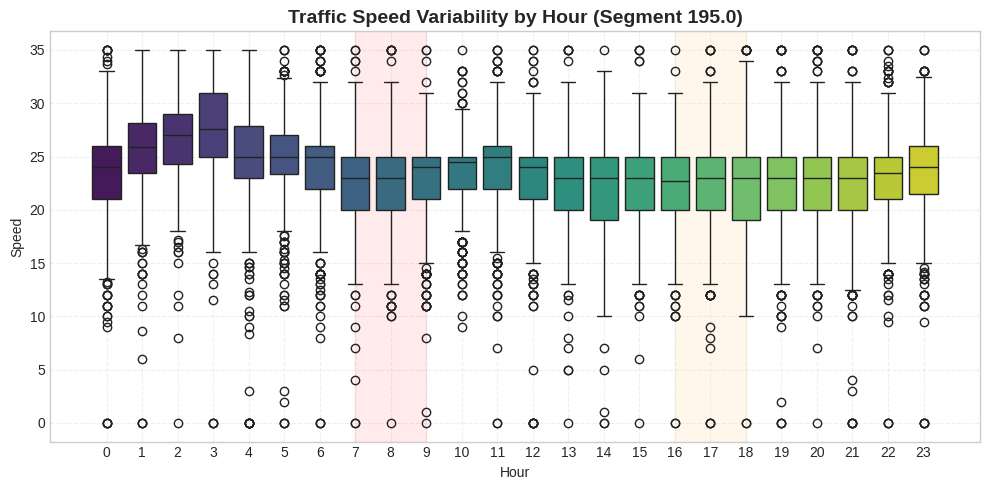

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


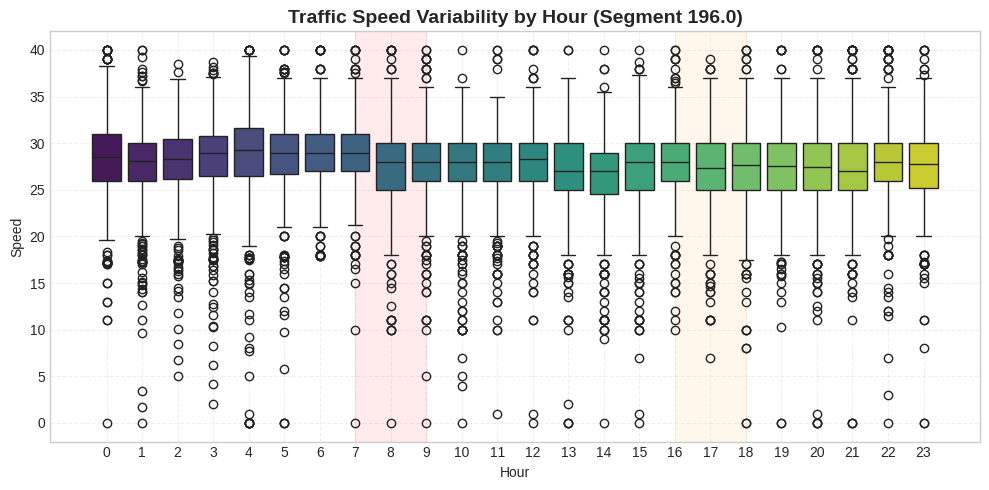

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


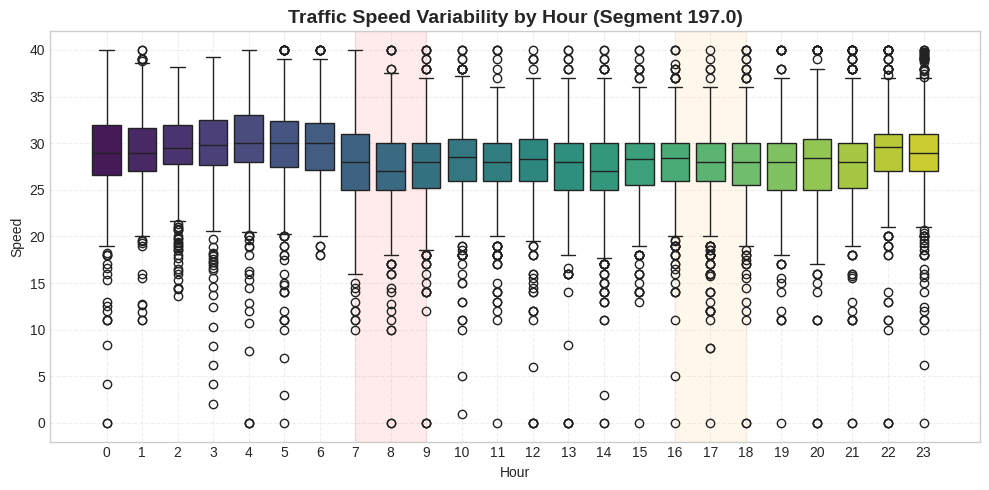

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


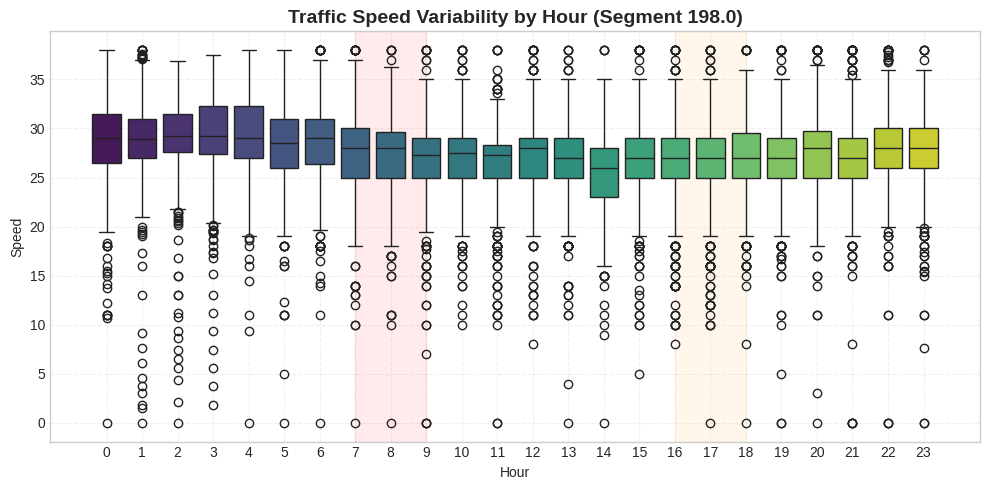

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


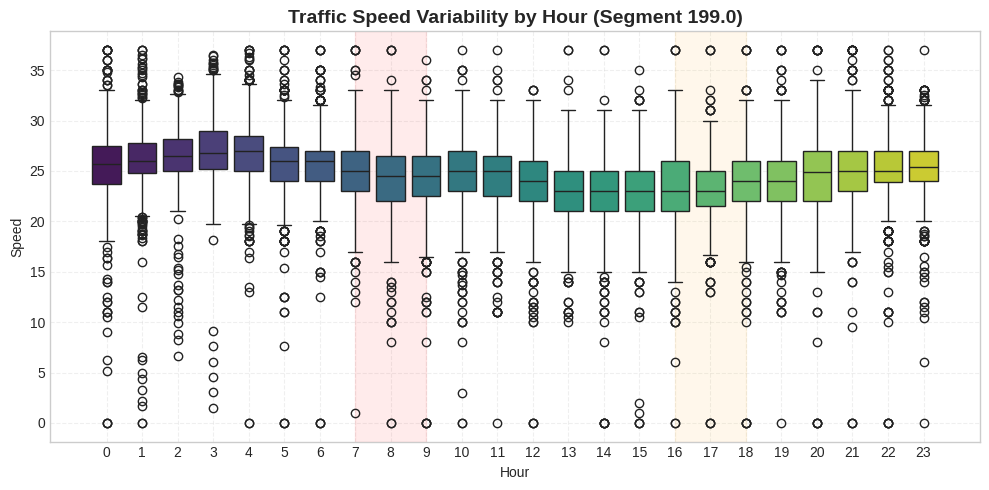

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


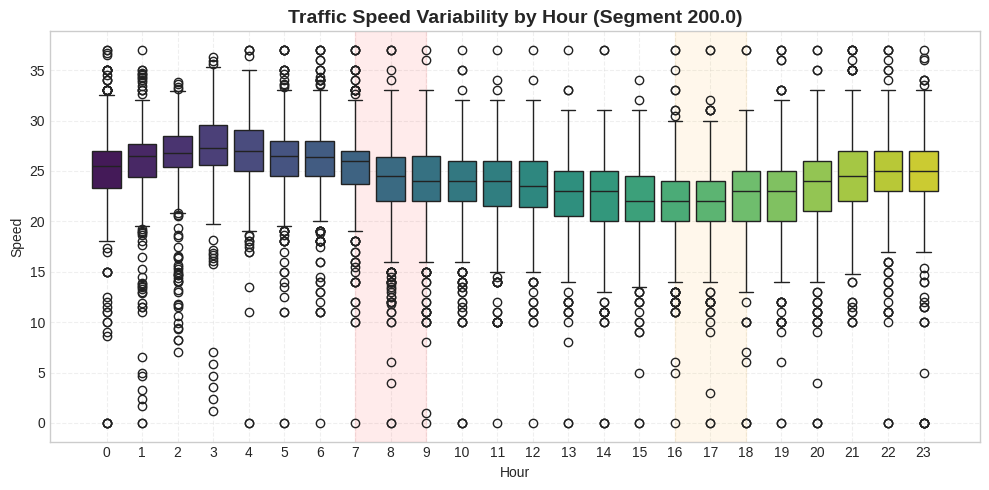

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


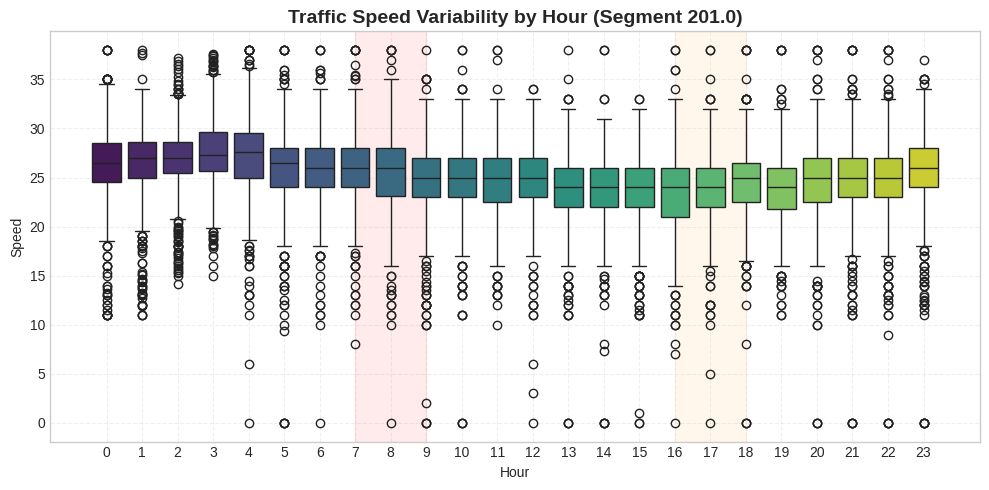

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


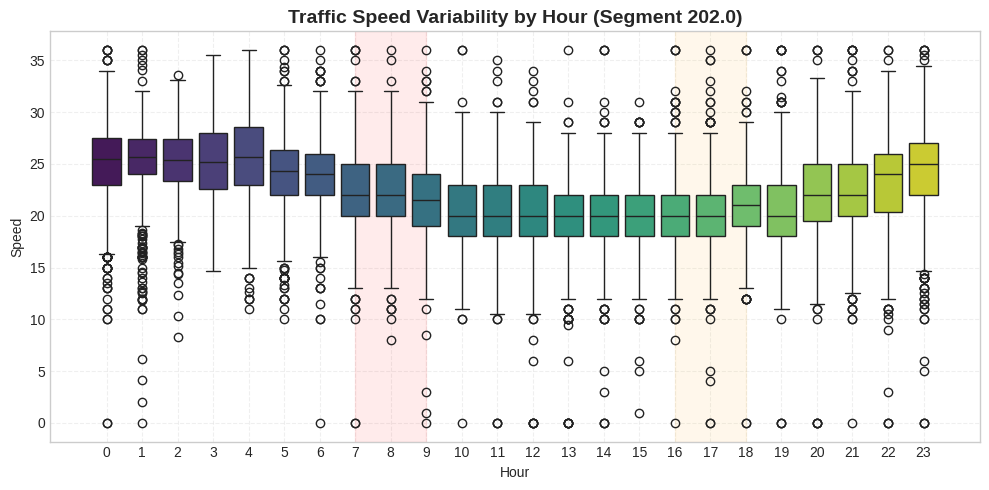

/tmp/ipykernel_5441/2917443470.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


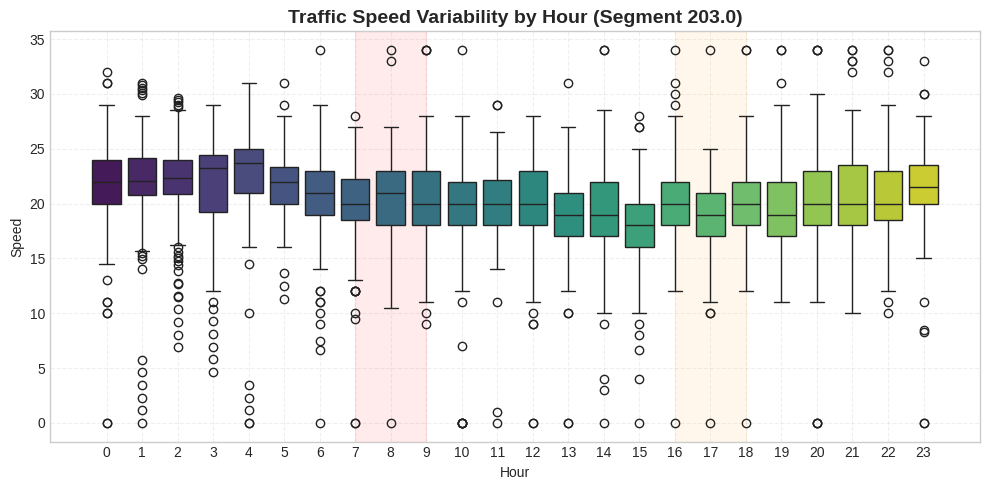

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Chicago traffic dataset with imputed speed values
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME column from string to datetime object
# Format: day/month/year hour:minute, errors="coerce" handles invalid dates
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")
# Extract the hour component (0-23) from the TIME column
df["HOUR"] = df["TIME"].dt.hour

# Set the visual style for plots (white background with grid)
plt.style.use("seaborn-v0_8-whitegrid")

# Get sorted list of unique segment IDs
segments = sorted(df["SEGMENT_ID"].unique())

# Loop through each road segment and generate a separate boxplot
for seg_id in segments:
    # Filter data for the current segment
    seg = df[df["SEGMENT_ID"] == seg_id]

    # Create a new figure with specified size (10 inches wide, 5 inches tall)
    plt.figure(figsize=(10,5))

    # Create boxplot showing speed distribution for each hour
    # x-axis: hour of day, y-axis: speed values
    sns.boxplot(
        x="HOUR",
        y="SPEED_FILLED",
        data=seg,
        palette="viridis"  # Color scheme for the boxes
    )

    # Highlight morning peak hours (7-9 AM) with light red background
    plt.axvspan(7, 9, color='red', alpha=0.08)
    # Highlight evening peak hours (4-6 PM) with light orange background
    plt.axvspan(16, 18, color='orange', alpha=0.08)

    # Set the chart title with segment number
    plt.title(
        f"Traffic Speed Variability by Hour (Segment {seg_id})",
        fontsize=14,
        fontweight='bold'
    )

    # Label the x-axis as "Hour"
    plt.xlabel("Hour")
    # Label the y-axis as "Speed"
    plt.ylabel("Speed")

    # Add grid lines with dashed style and low opacity for better readability
    plt.grid(True, linestyle='--', alpha=0.3)

    # Adjust layout to prevent overlapping elements
    plt.tight_layout()
    # Display the plot
    plt.show()

##Missing speed ratio per segment

/tmp/ipykernel_5441/1568382087.py:5: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


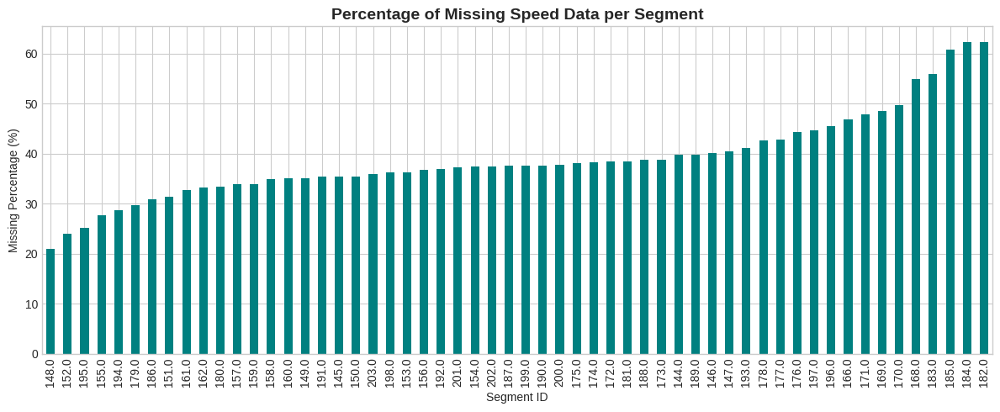

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")

# Compute missing ratio per segment
missing_ratio = df.groupby("SEGMENT_ID")["SPEED"].apply(lambda x: x.isna().mean() * 100)

# Plot cleanly and identify grid size
plt.style.use("seaborn-v0_8-whitegrid")
plt.figure(figsize=(12,5))

missing_ratio.sort_values().plot(kind="bar", color="teal")

#choose grid title and axis labels
plt.title("Percentage of Missing Speed Data per Segment", fontsize=14, fontweight='bold')
plt.xlabel("Segment ID")
plt.ylabel("Missing Percentage (%)")

plt.tight_layout()
plt.show()

## Percentage of Missing speed data

/tmp/ipykernel_5441/3027182409.py:5: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


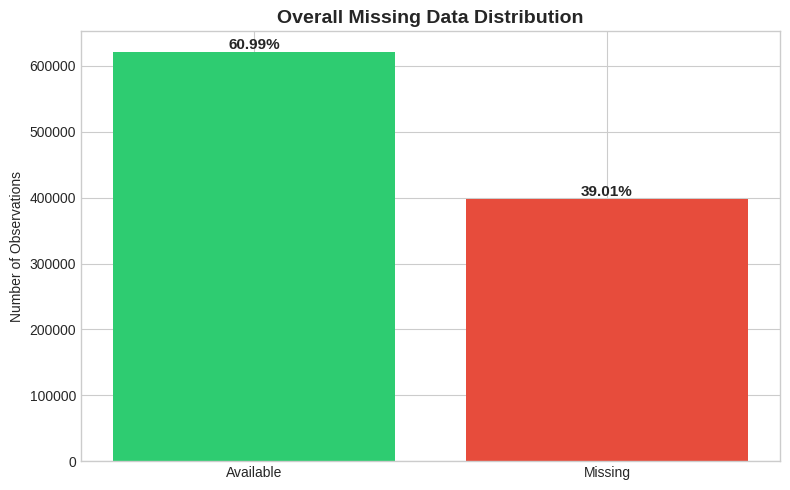

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("chicago_traffic_imputed.csv")

# Compute missing counts (how many speeds are missing and how many arent)
missing_count = df["SPEED"].isna().sum()
available_count = df["SPEED"].notna().sum()

labels = ["Available", "Missing"]
values = [available_count, missing_count]

# Convert  values to percentages
total = sum(values)
percentages = [v / total * 100 for v in values]

# Plot cleanly and choose figure size
plt.style.use("seaborn-v0_8-whitegrid")
plt.figure(figsize=(8,5))

bars = plt.bar(labels, values, color=["#2ecc71", "#e74c3c"])

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        f"{percentages[i]:.2f}%",
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.title("Overall Missing Data Distribution", fontsize=14, fontweight='bold')
plt.ylabel("Number of Observations")

plt.tight_layout()
plt.show()

##Missing Data Trend Analysis  over time
This code's objective is to show how the percentage of missing speed data in the Chicago traffic dataset varies over time, assisting in the discovery of temporal trends in data quality.

/tmp/ipykernel_5441/2668109518.py:5: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("chicago_traffic_imputed.csv")


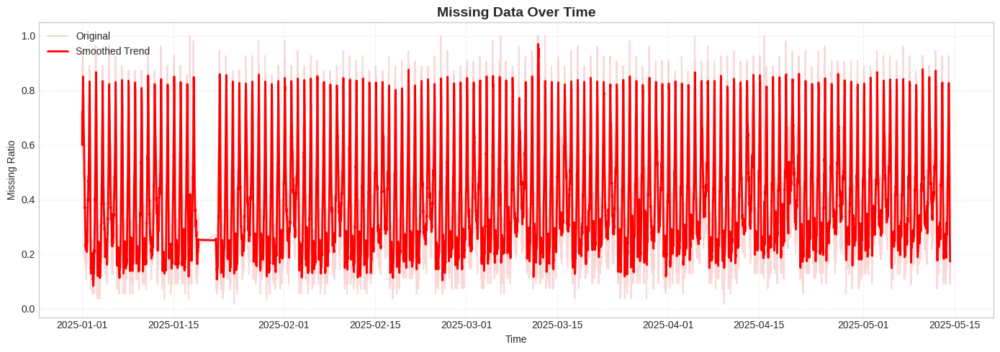

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("chicago_traffic_imputed.csv")

# Convert TIME
df["TIME"] = pd.to_datetime(df["TIME"], format="%d/%m/%Y %H:%M", errors="coerce")

# Compute missing ratio over time
missing_time = df.groupby("TIME")["SPEED"].apply(lambda x: x.isna().mean())

# Smooth the curve (rolling average)
missing_smooth = missing_time.rolling(window=10, min_periods=1).mean()

# Plot cleanly
plt.style.use("seaborn-v0_8-whitegrid")
plt.figure(figsize=(14,5))

# Original (light)
plt.plot(missing_time, color="lightcoral", alpha=0.3, label="Original")

# Smoothed (main line)
plt.plot(missing_smooth, color="red", linewidth=2, label="Smoothed Trend")

plt.title("Missing Data Over Time", fontsize=14, fontweight='bold')
plt.xlabel("Time")
plt.ylabel("Missing Ratio")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()